In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision.io import read_image
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader, Dataset
import matplotlib.pyplot as plt
import numpy as np
from common.utils import weights_init, save_config, save_loss, get_FID
from common.dataset import USImagesDataset
import yaml
import random
import os
from unet.model import UNet
from torch.nn.utils import spectral_norm
from datetime import datetime

import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

torch.manual_seed(0)
random.seed(0)
np.random.seed(0)

%matplotlib inline

def show_tensor_images(image_tensor, num_images=5, size=(1, 200, 200)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
#     plt.savefig(f"gan-results/gan_epoch-{epoch}-examples.pdf", bbox_inches='tight')
    plt.show()

In [2]:
class Generator(nn.Module):
    def __init__(self, z_dim=64, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        self.gen = nn.Sequential( # 150
            self.make_gen_block(z_dim, hidden_dim * 16),  # 4x4,
            self.make_gen_block(hidden_dim * 16, hidden_dim * 8, stride=2),  # 3*2+4=10,
            self.make_gen_block(hidden_dim * 8, hidden_dim * 4), # 9*3+4=31,
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=5, stride=2), # 30*2+5=65
            self.make_gen_block(hidden_dim * 2, hidden_dim, kernel_size=5, stride=3), # 64*3+5=197,
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, stride=1, final_layer=True)  #196+4 = 200x200
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=4, stride=3, final_layer=False):
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride, bias=False),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride, bias=False),
                nn.Tanh(),
            )

    def forward(self, noise):
        x = self.gen(noise)
        return x


class Discriminator(nn.Module):
    def __init__(self, im_chan=1, hidden_dim=64, spectral_norm=True):
        super(Discriminator, self).__init__()
        self.spectral_norm = spectral_norm
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, hidden_dim * 4),
            self.make_crit_block(hidden_dim * 4, 1, final_layer=True),
        )
        self.sigmoid = nn.Sigmoid()

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        if not final_layer:
            return nn.Sequential(
                spectral_norm(nn.Conv2d(input_channels, output_channels, kernel_size, stride, bias=False))
                if self.spectral_norm 
                else nn.Conv2d(input_channels, output_channels, kernel_size, stride, bias=False),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                spectral_norm(nn.Conv2d(input_channels, output_channels, kernel_size, stride, bias=False))
                if self.spectral_norm 
                else nn.Conv2d(input_channels, output_channels, kernel_size, stride, bias=False)
            )

    def forward(self, image):
        crit_pred = self.crit(image)
        features = crit_pred.view(len(crit_pred), -1)
        logits = self.sigmoid(features)
        return logits, features

In [3]:
def get_noise(n_samples, z_dim, device='cpu'):
    return torch.randn(n_samples, z_dim, 1, 1, device=device)

def get_disc_loss(crit_fake_pred, crit_real_pred):
    crit_loss = 0.5 * (crit_real_pred - torch.ones_like(crit_real_pred)).pow(2) + 0.5 * crit_fake_pred.pow(2)
    return crit_loss.mean()

def get_gen_loss(crit_fake_pred):
    gen_loss = 0.5 * (crit_fake_pred - torch.ones_like(crit_fake_pred)).pow(2)
    return gen_loss.mean()

In [4]:
config = {
    "image_path": "/home/student/synthetic-us-images/camus-images/image",
    "device": "cuda",
    "beta_1": 0.5,
    "beta_2": 0.999,
    "disc_repeats": 2,
    "gen_repeats": 1,
    "batch_size": 4,
    "disc_lr": 4e-4,
    "gen_lr": 1e-4,
    "n_epochs": 150,
    "epoch_log_step": 5,
    "z_dim": 32,
    "initial_shape": 200,  
    "spectral_norm": True
}

In [5]:
dt = datetime.today().strftime("%d-%m-%Y-%H:%M")
result_folder = f"gan-lsloss-{dt}"
if not os.path.exists(result_folder):
    os.mkdir(result_folder)

save_config(f"{result_folder}/config.json", config)

In [6]:
def save_model(epoch, gen, disc, opt_g, opt_d):
    torch.save({
        "epoch": epoch,
        "opt_g": opt_g.state_dict(),
        "gan": gen.state_dict(),
        "opt_d": opt_d.state_dict(),
        "disc": disc.state_dict()
    }, f"{result_folder}/{epoch}.pth")

In [7]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5), (0.5)),
    transforms.Resize((config["initial_shape"], config["initial_shape"]))
    
])
dataset = USImagesDataset(config["image_path"], image_transform=transform)
dataloader = DataLoader(dataset, batch_size=config["batch_size"], num_workers=0)

criterion = nn.L1Loss()


[EPOCH 1/150 | Loss_D: 0.0222 Loss_G: 0.4547


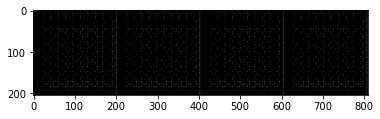

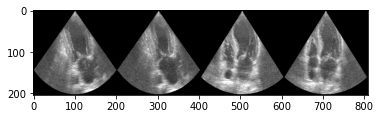

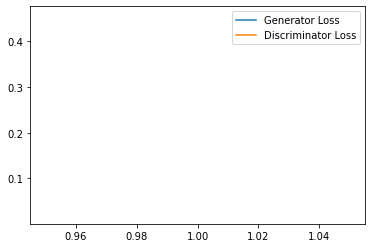


[EPOCH 2/150 | Loss_D: 0.0045 Loss_G: 0.4803


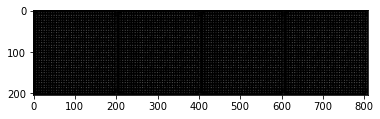

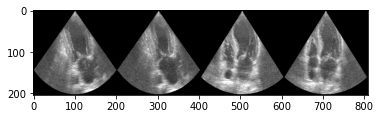

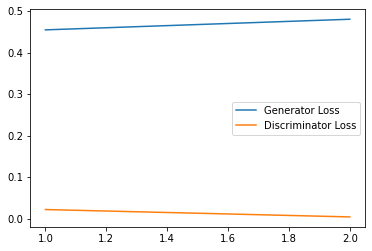


[EPOCH 3/150 | Loss_D: 0.0023 Loss_G: 0.4773


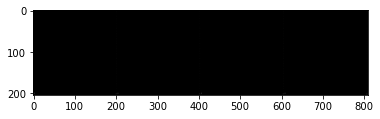

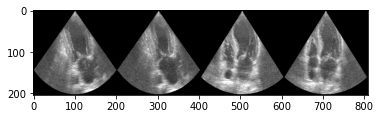

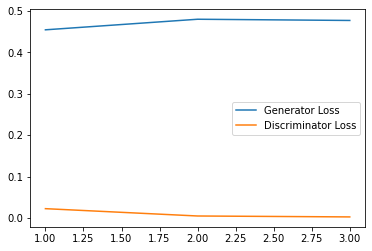


[EPOCH 4/150 | Loss_D: 0.0045 Loss_G: 0.4728


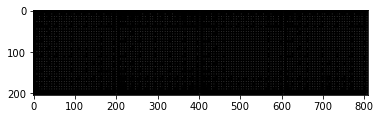

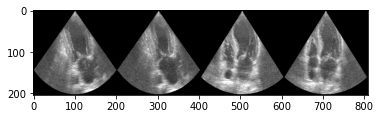

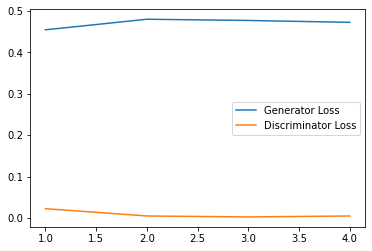


[EPOCH 5/150 | Loss_D: 0.0013 Loss_G: 0.4874


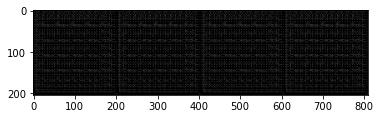

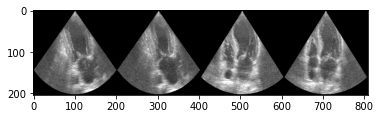

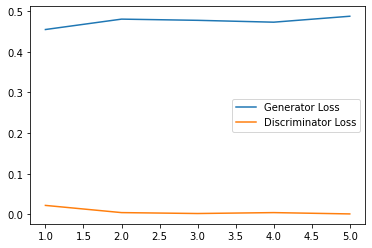


[EPOCH 6/150 | Loss_D: 0.0006 Loss_G: 0.4905


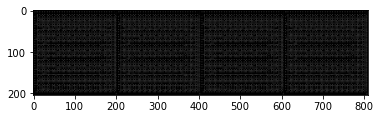

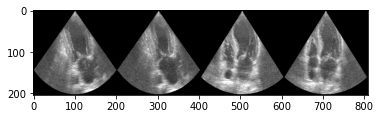

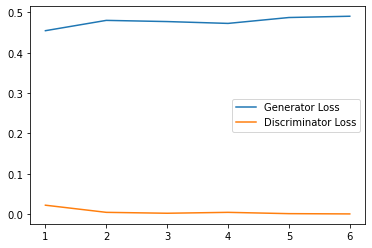


[EPOCH 7/150 | Loss_D: 0.0006 Loss_G: 0.4919


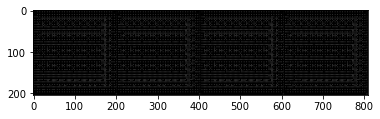

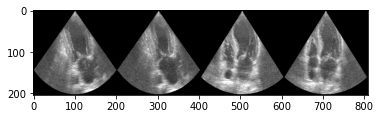

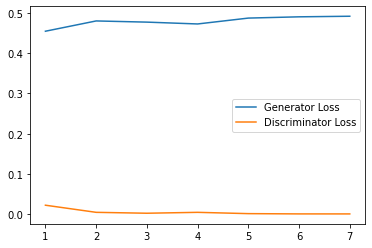


[EPOCH 8/150 | Loss_D: 0.0000 Loss_G: 0.4952


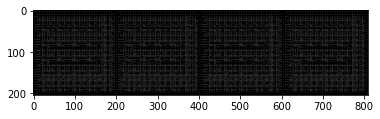

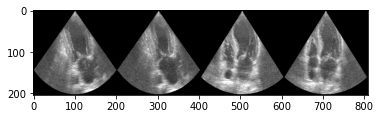

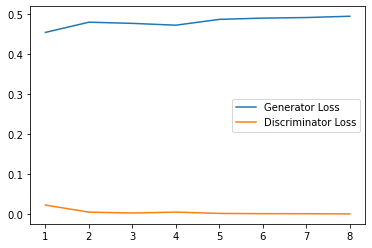


[EPOCH 9/150 | Loss_D: 0.0000 Loss_G: 0.4968


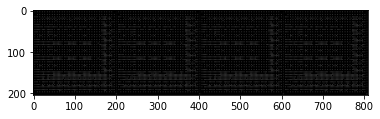

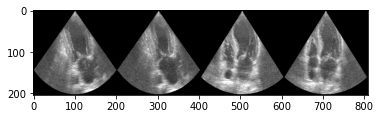

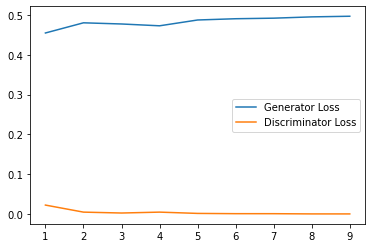


[EPOCH 10/150 | Loss_D: 0.0019 Loss_G: 0.4905


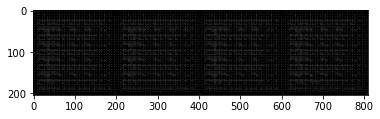

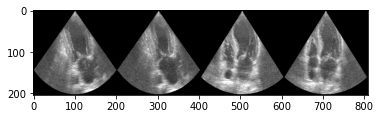

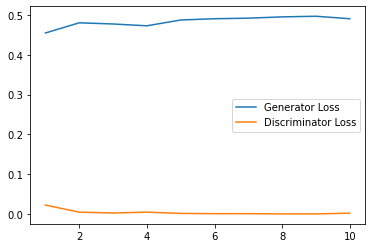


[EPOCH 11/150 | Loss_D: 0.0000 Loss_G: 0.4947


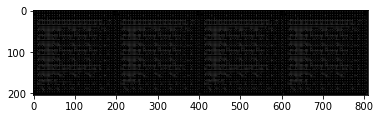

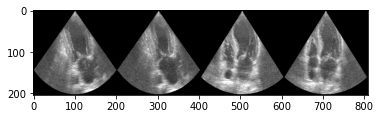

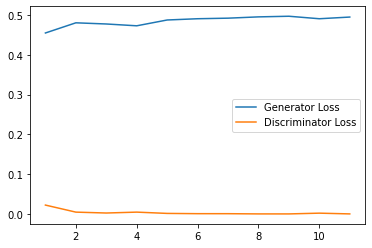


[EPOCH 12/150 | Loss_D: 0.0002 Loss_G: 0.4934


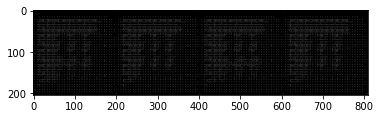

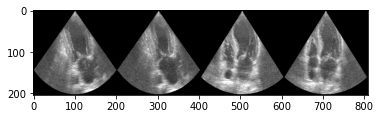

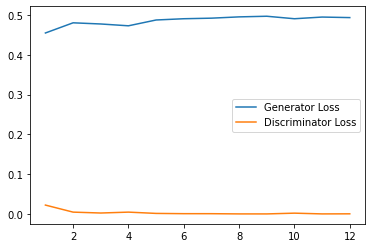


[EPOCH 13/150 | Loss_D: 0.0026 Loss_G: 0.4845


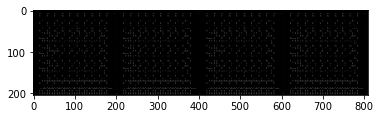

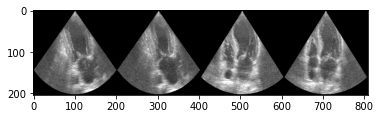

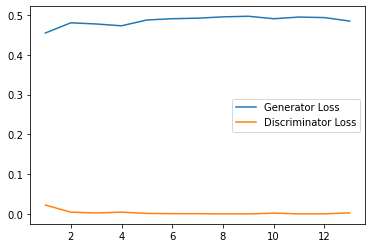


[EPOCH 14/150 | Loss_D: 0.0005 Loss_G: 0.4867


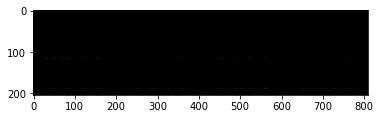

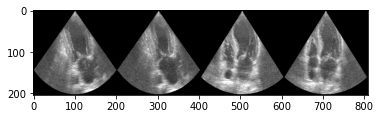

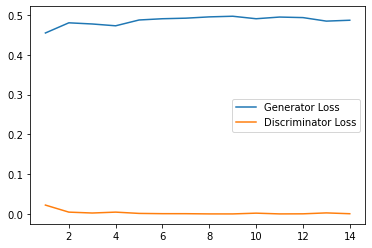


[EPOCH 15/150 | Loss_D: 0.0001 Loss_G: 0.4936


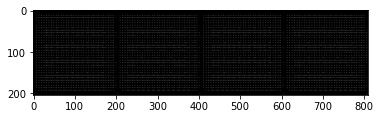

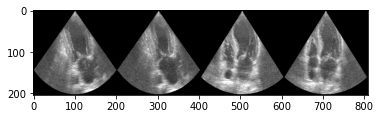

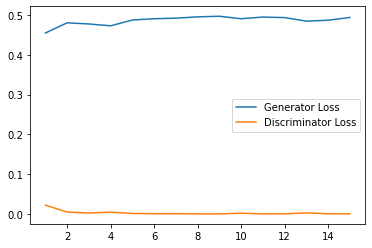


[EPOCH 16/150 | Loss_D: 0.0000 Loss_G: 0.4962


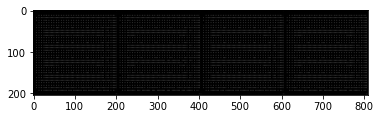

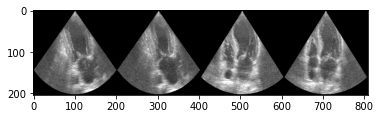

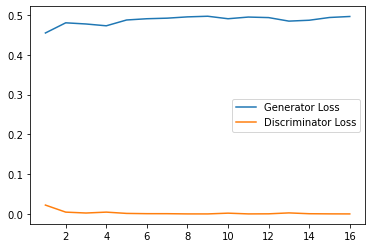


[EPOCH 17/150 | Loss_D: 0.0000 Loss_G: 0.4973


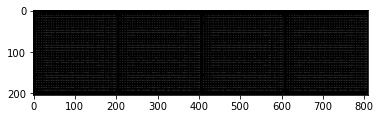

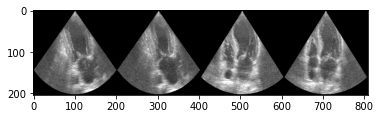

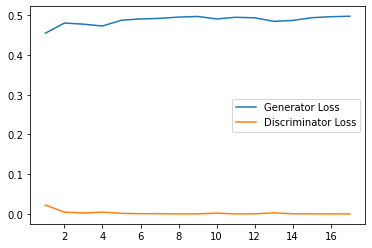


[EPOCH 18/150 | Loss_D: 0.0000 Loss_G: 0.4980


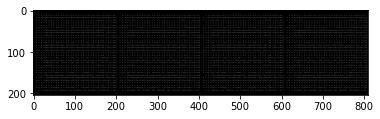

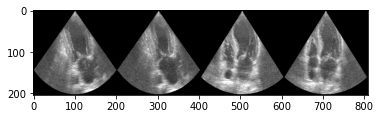

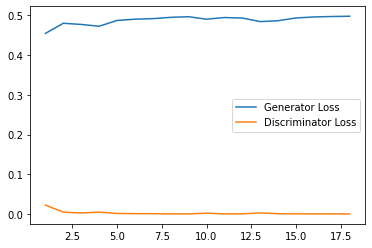


[EPOCH 19/150 | Loss_D: 0.0000 Loss_G: 0.4984


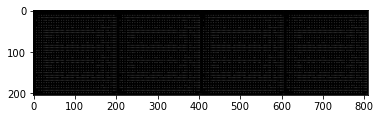

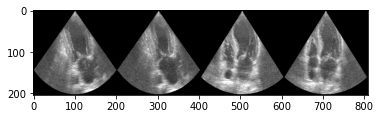

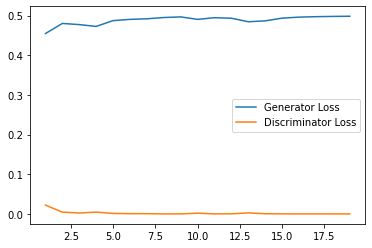


[EPOCH 20/150 | Loss_D: 0.0000 Loss_G: 0.4987


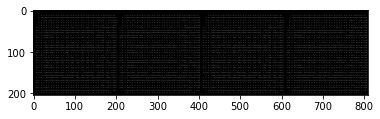

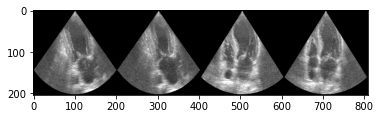

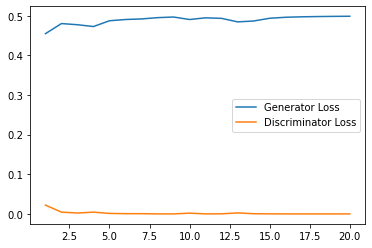


[EPOCH 21/150 | Loss_D: 0.0000 Loss_G: 0.4990


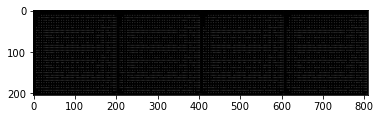

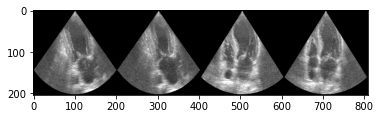

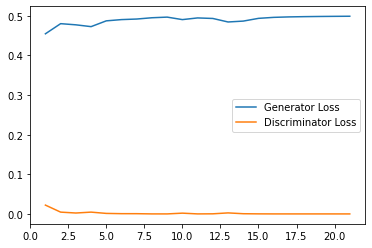


[EPOCH 22/150 | Loss_D: 0.0000 Loss_G: 0.4992


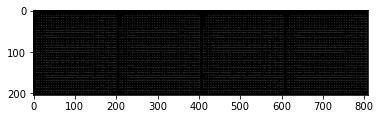

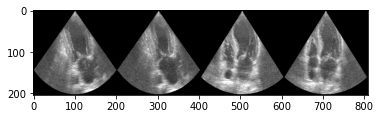

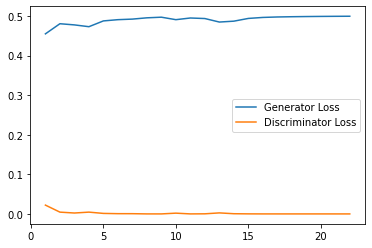


[EPOCH 23/150 | Loss_D: 0.0000 Loss_G: 0.4993


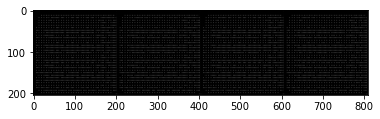

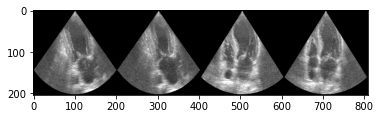

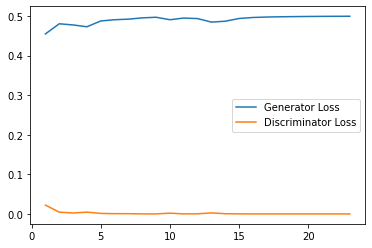


[EPOCH 24/150 | Loss_D: 0.0016 Loss_G: 0.4896


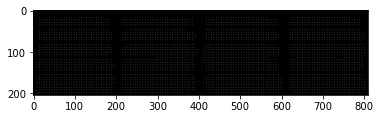

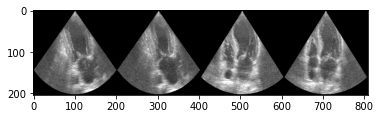

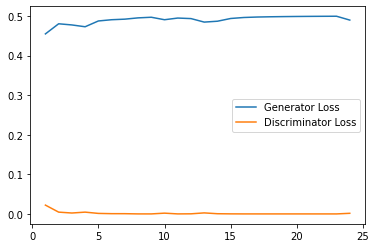


[EPOCH 25/150 | Loss_D: 0.0001 Loss_G: 0.4946


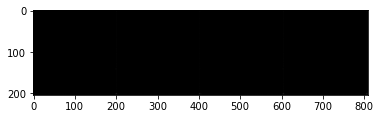

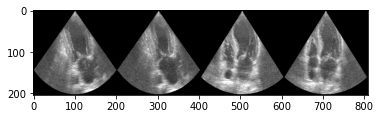

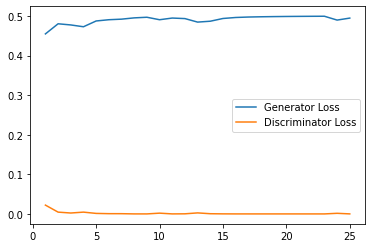


[EPOCH 26/150 | Loss_D: 0.0003 Loss_G: 0.4902


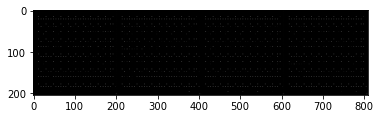

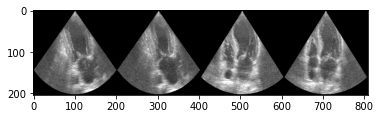

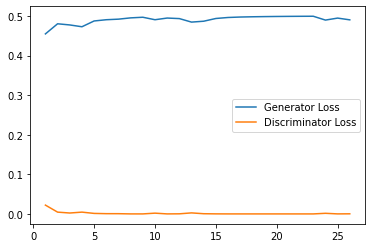


[EPOCH 27/150 | Loss_D: 0.0000 Loss_G: 0.4963


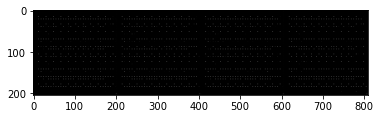

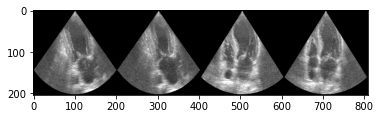

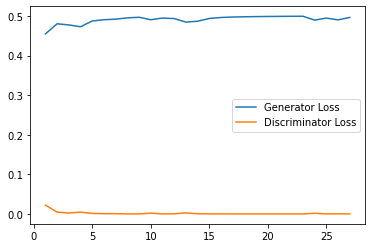


[EPOCH 28/150 | Loss_D: 0.0000 Loss_G: 0.4976


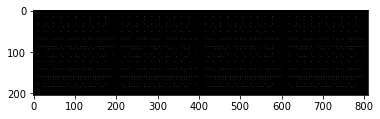

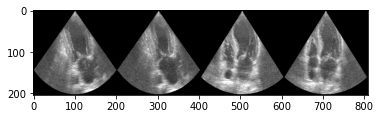

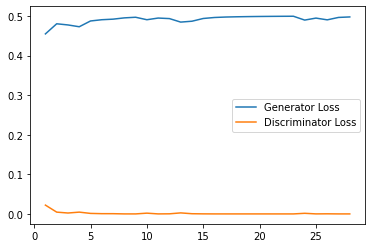


[EPOCH 29/150 | Loss_D: 0.0000 Loss_G: 0.4976


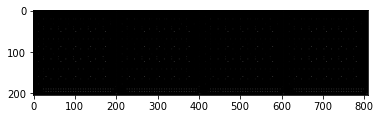

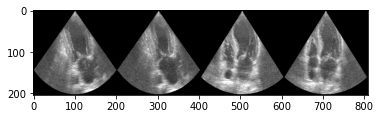

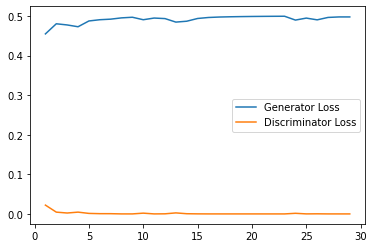


[EPOCH 30/150 | Loss_D: 0.0004 Loss_G: 0.4927


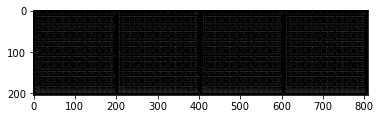

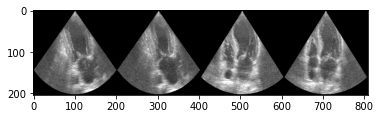

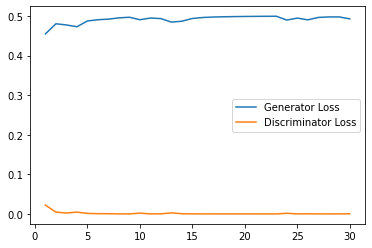


[EPOCH 31/150 | Loss_D: 0.0001 Loss_G: 0.4926


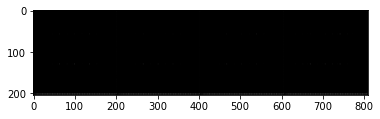

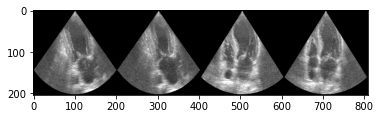

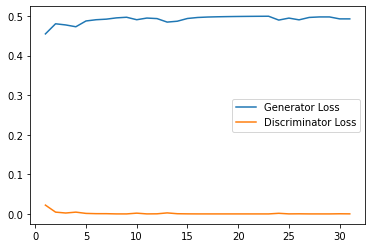


[EPOCH 32/150 | Loss_D: 0.0010 Loss_G: 0.4907


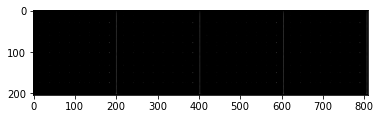

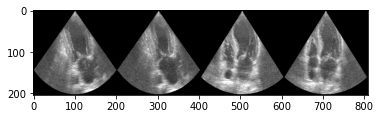

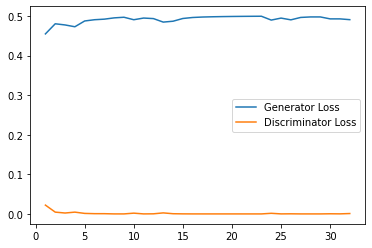


[EPOCH 33/150 | Loss_D: 0.0002 Loss_G: 0.4931


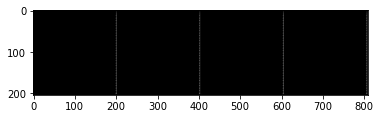

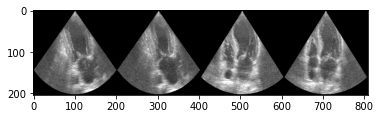

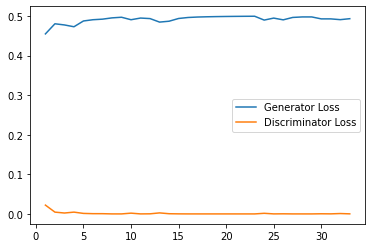


[EPOCH 34/150 | Loss_D: 0.0007 Loss_G: 0.4906


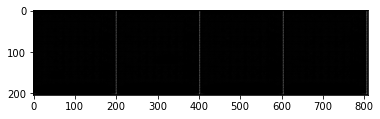

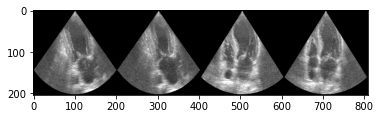

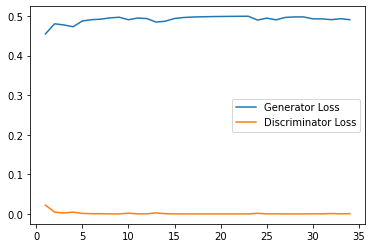


[EPOCH 35/150 | Loss_D: 0.1043 Loss_G: 0.3163


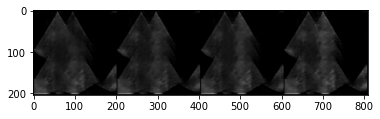

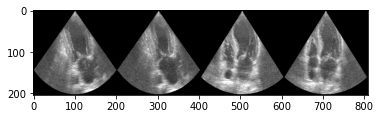

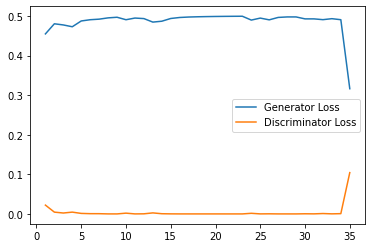


[EPOCH 36/150 | Loss_D: 0.0942 Loss_G: 0.3056


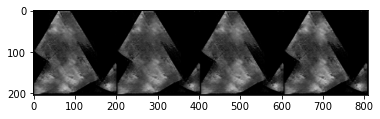

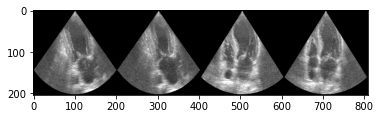

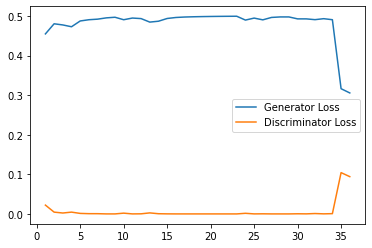


[EPOCH 37/150 | Loss_D: 0.0639 Loss_G: 0.3499


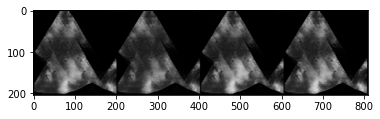

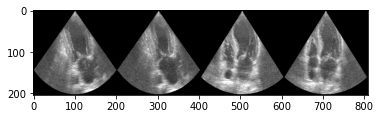

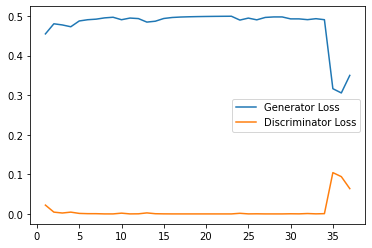


[EPOCH 38/150 | Loss_D: 0.0484 Loss_G: 0.3768


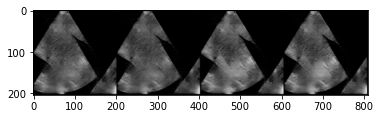

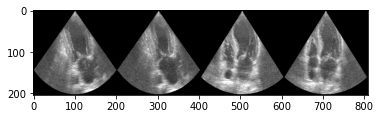

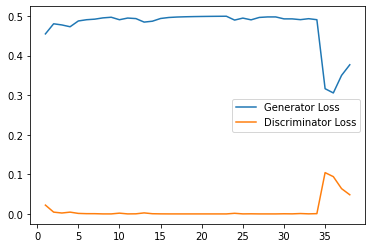


[EPOCH 39/150 | Loss_D: 0.0419 Loss_G: 0.3893


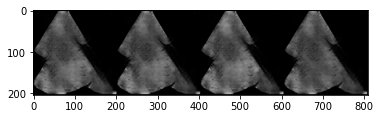

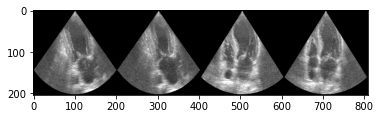

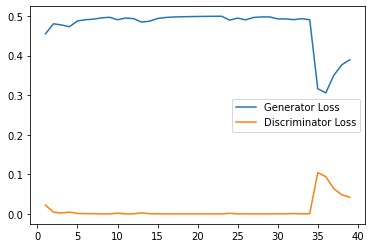


[EPOCH 40/150 | Loss_D: 0.0540 Loss_G: 0.3671


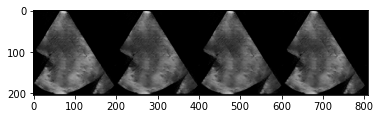

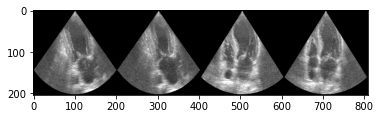

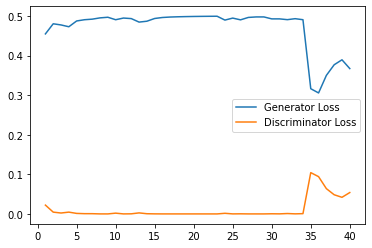


[EPOCH 41/150 | Loss_D: 0.0421 Loss_G: 0.3869


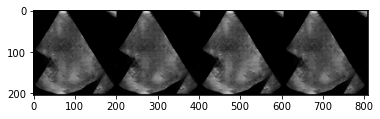

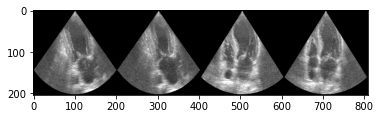

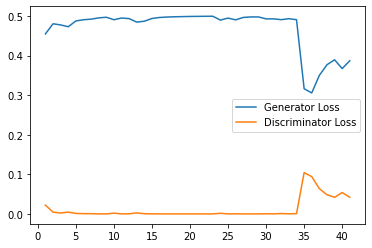


[EPOCH 42/150 | Loss_D: 0.0380 Loss_G: 0.3953


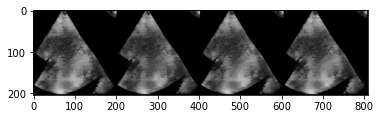

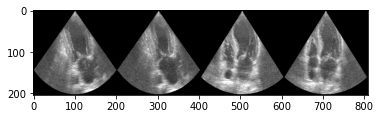

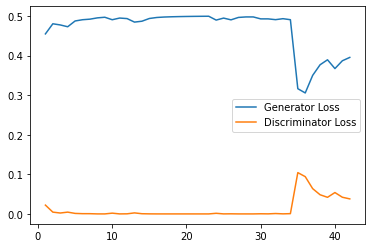


[EPOCH 43/150 | Loss_D: 0.0386 Loss_G: 0.3946


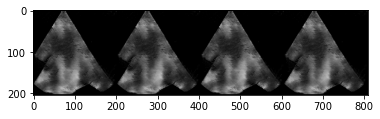

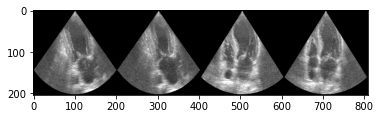

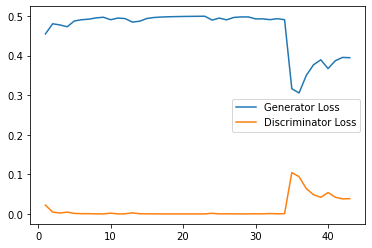


[EPOCH 44/150 | Loss_D: 0.0532 Loss_G: 0.3730


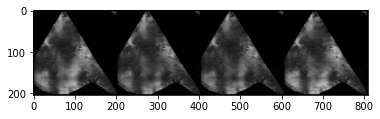

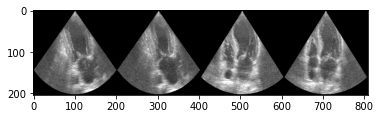

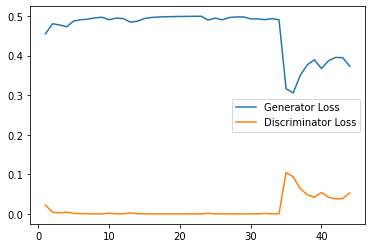


[EPOCH 45/150 | Loss_D: 0.0413 Loss_G: 0.3911


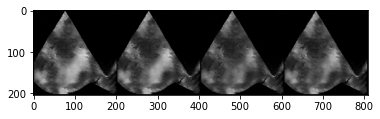

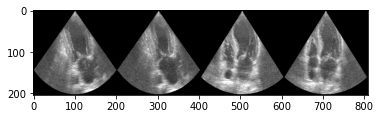

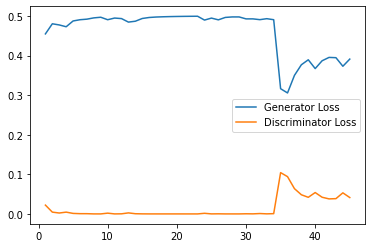


[EPOCH 46/150 | Loss_D: 0.0352 Loss_G: 0.4043


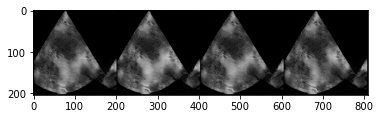

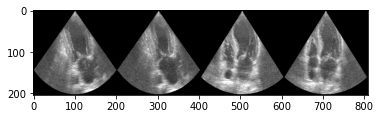

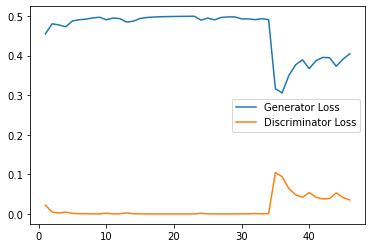


[EPOCH 47/150 | Loss_D: 0.0331 Loss_G: 0.4092


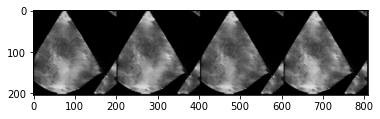

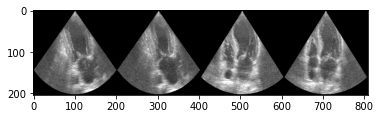

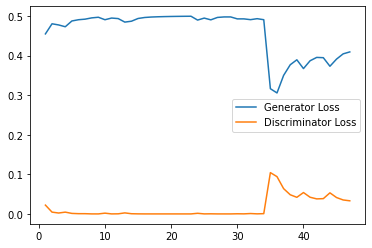


[EPOCH 48/150 | Loss_D: 0.0328 Loss_G: 0.4078


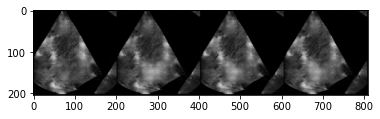

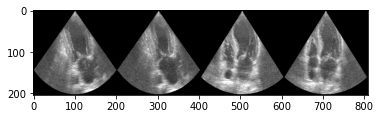

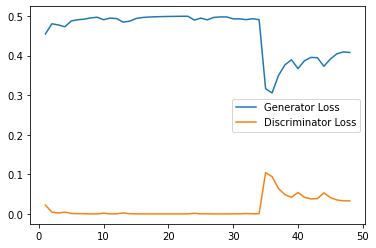


[EPOCH 49/150 | Loss_D: 0.0308 Loss_G: 0.4130


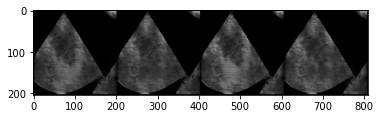

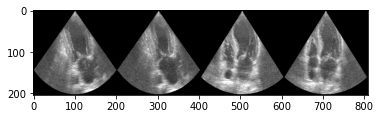

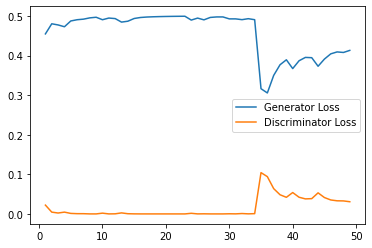


[EPOCH 50/150 | Loss_D: 0.0372 Loss_G: 0.3998


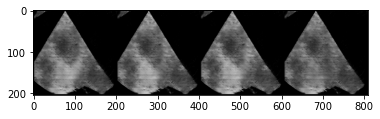

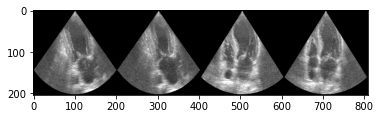

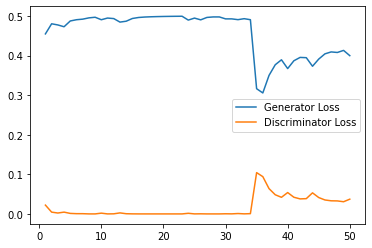


[EPOCH 51/150 | Loss_D: 0.0765 Loss_G: 0.3347


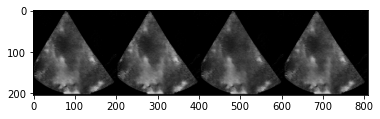

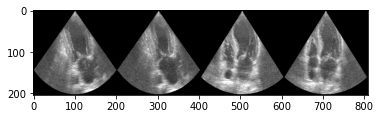

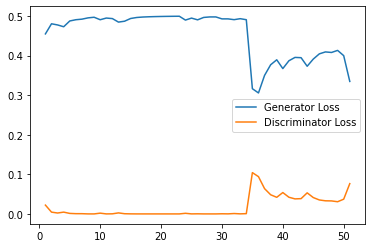


[EPOCH 52/150 | Loss_D: 0.0704 Loss_G: 0.3405


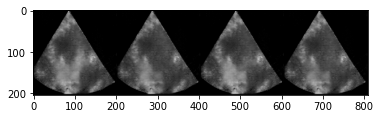

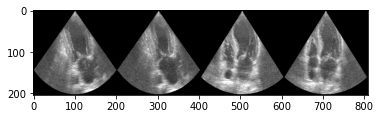

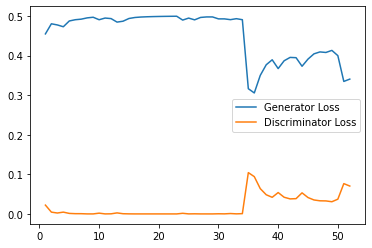


[EPOCH 53/150 | Loss_D: 0.0648 Loss_G: 0.3502


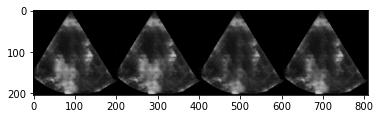

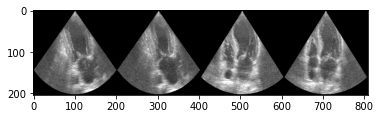

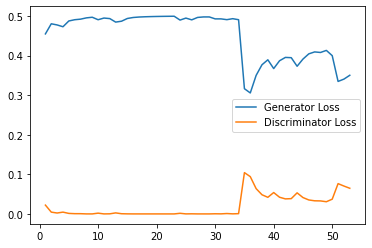


[EPOCH 54/150 | Loss_D: 0.1020 Loss_G: 0.3024


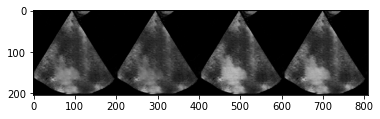

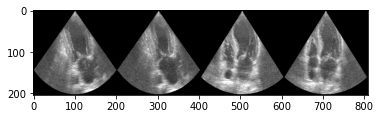

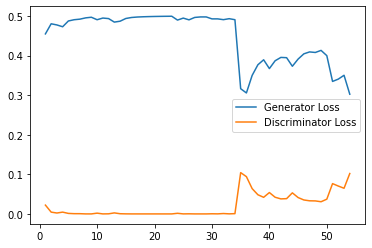


[EPOCH 55/150 | Loss_D: 0.1102 Loss_G: 0.2941


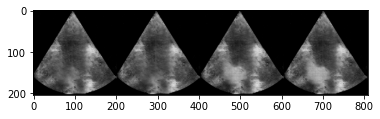

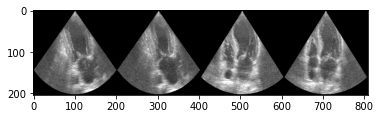

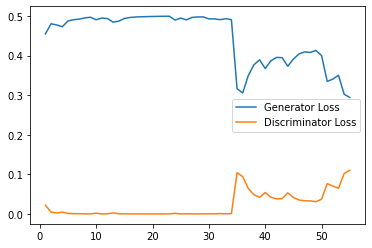


[EPOCH 56/150 | Loss_D: 0.1371 Loss_G: 0.2665


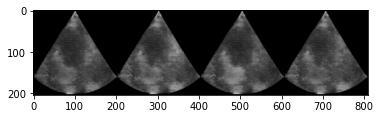

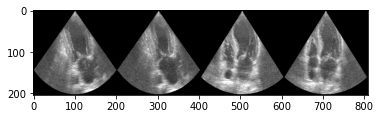

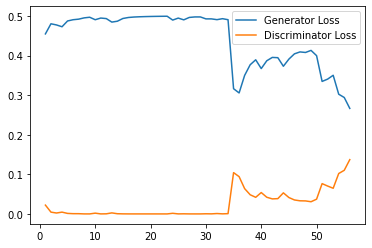


[EPOCH 57/150 | Loss_D: 0.2531 Loss_G: 0.1579


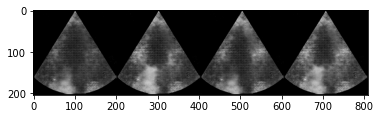

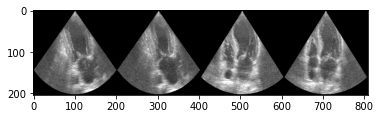

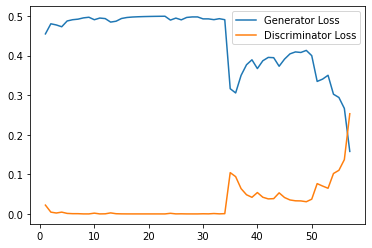


[EPOCH 58/150 | Loss_D: 0.2483 Loss_G: 0.1472


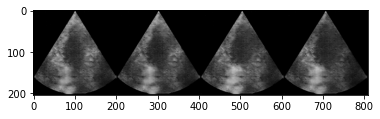

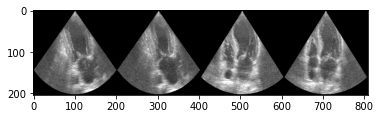

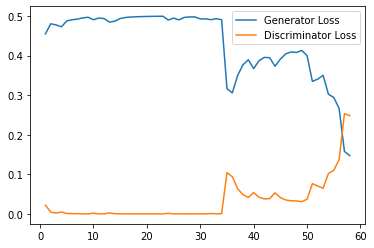


[EPOCH 59/150 | Loss_D: 0.2479 Loss_G: 0.1414


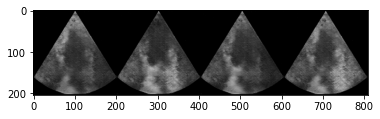

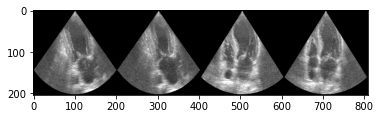

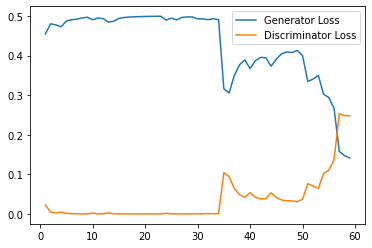


[EPOCH 60/150 | Loss_D: 0.2474 Loss_G: 0.1447


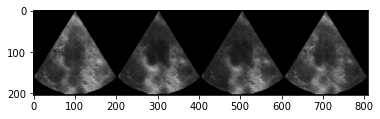

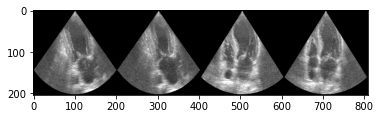

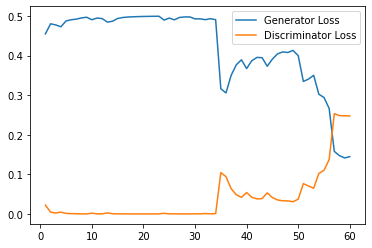


[EPOCH 61/150 | Loss_D: 0.2475 Loss_G: 0.1438


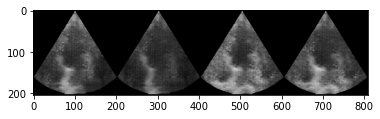

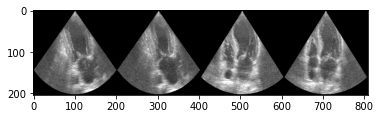

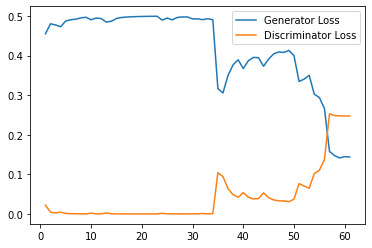


[EPOCH 62/150 | Loss_D: 0.2456 Loss_G: 0.1462


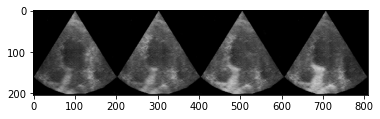

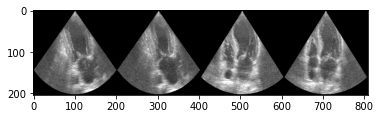

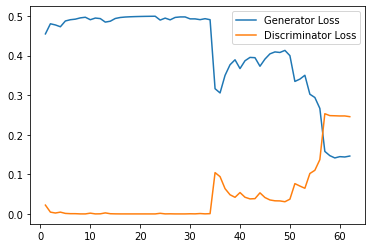


[EPOCH 63/150 | Loss_D: 0.2468 Loss_G: 0.1420


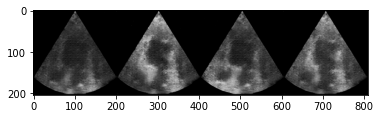

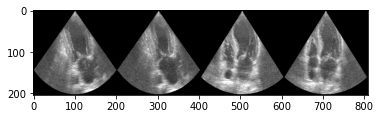

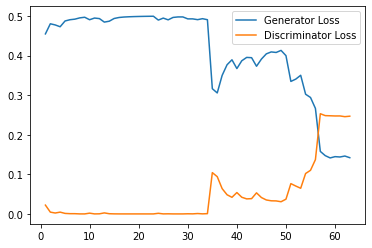


[EPOCH 64/150 | Loss_D: 0.2483 Loss_G: 0.1437


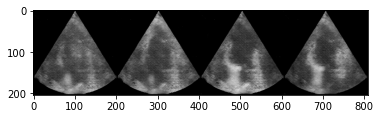

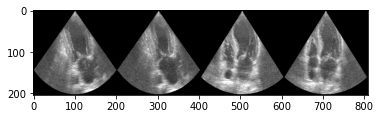

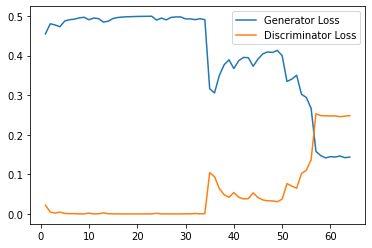


[EPOCH 65/150 | Loss_D: 0.2476 Loss_G: 0.1437


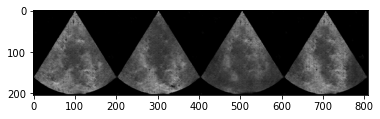

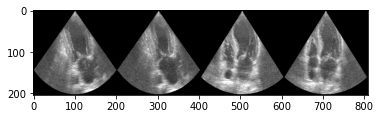

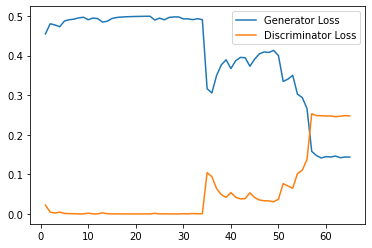


[EPOCH 66/150 | Loss_D: 0.2471 Loss_G: 0.1422


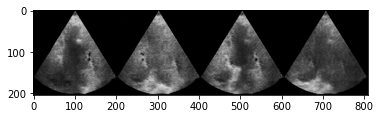

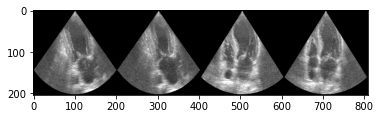

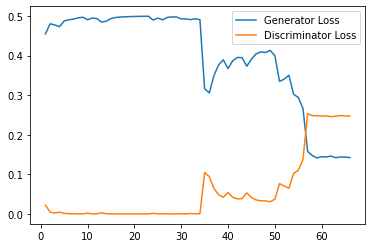


[EPOCH 67/150 | Loss_D: 0.2476 Loss_G: 0.1418


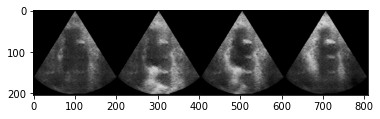

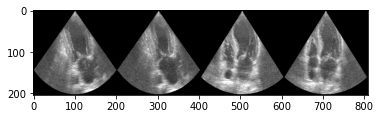

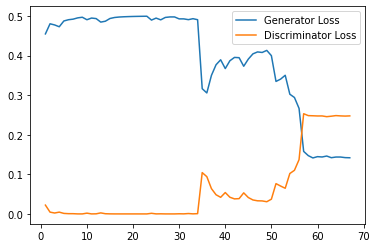


[EPOCH 68/150 | Loss_D: 0.2465 Loss_G: 0.1423


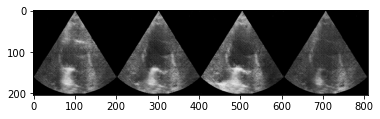

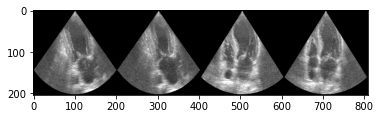

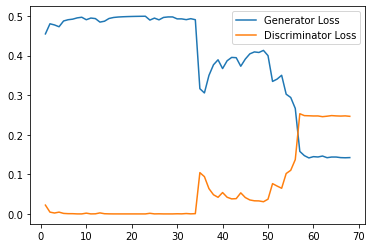


[EPOCH 69/150 | Loss_D: 0.2470 Loss_G: 0.1417


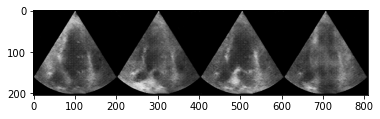

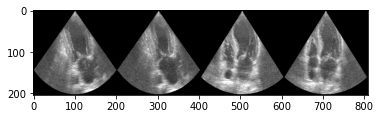

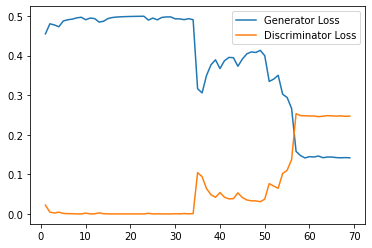


[EPOCH 70/150 | Loss_D: 0.2460 Loss_G: 0.1424


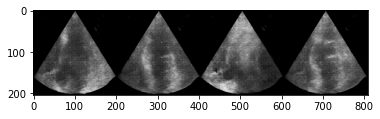

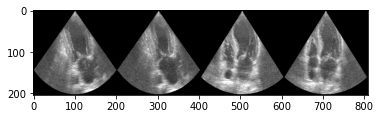

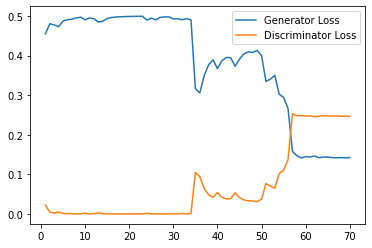


[EPOCH 71/150 | Loss_D: 0.2399 Loss_G: 0.1529


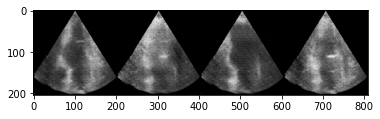

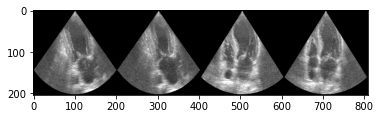

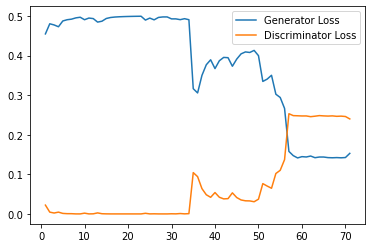


[EPOCH 72/150 | Loss_D: 0.2472 Loss_G: 0.1426


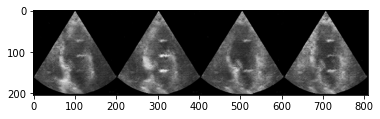

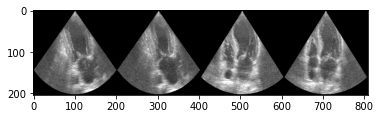

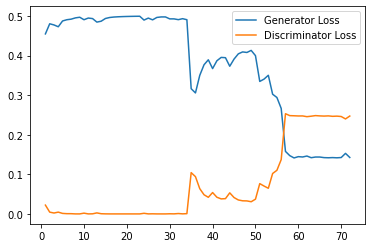


[EPOCH 73/150 | Loss_D: 0.2452 Loss_G: 0.1392


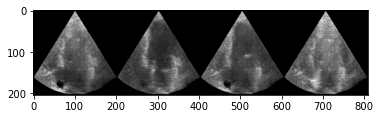

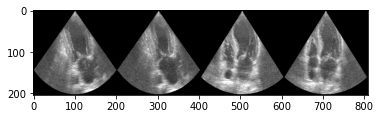

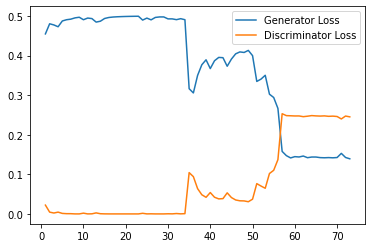


[EPOCH 74/150 | Loss_D: 0.2442 Loss_G: 0.1484


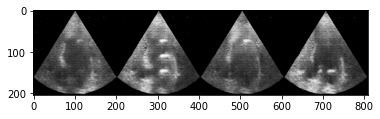

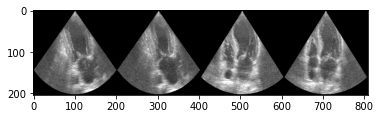

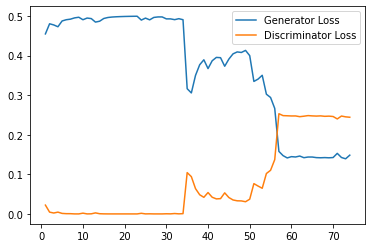


[EPOCH 75/150 | Loss_D: 0.2335 Loss_G: 0.1506


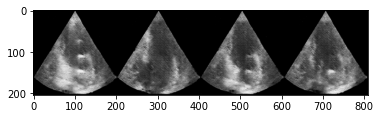

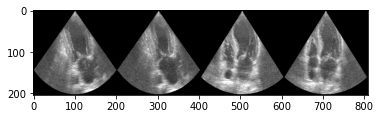

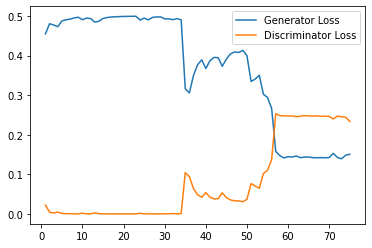


[EPOCH 76/150 | Loss_D: 0.2437 Loss_G: 0.1454


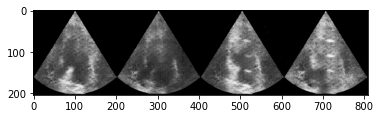

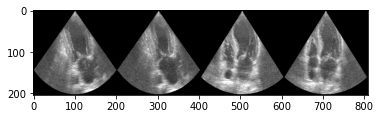

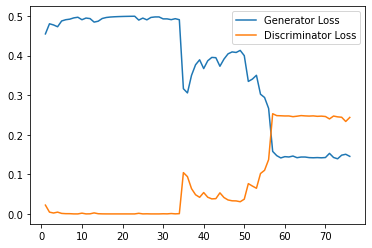


[EPOCH 77/150 | Loss_D: 0.2450 Loss_G: 0.1396


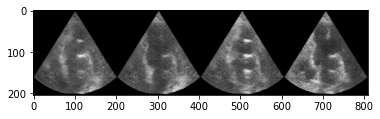

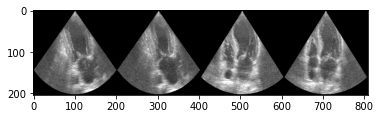

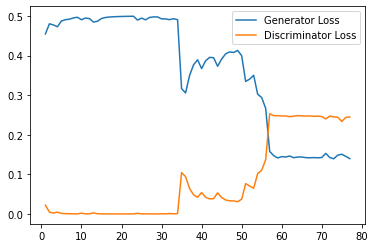


[EPOCH 78/150 | Loss_D: 0.2455 Loss_G: 0.1402


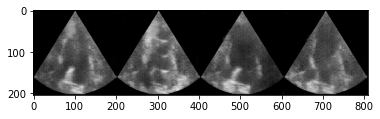

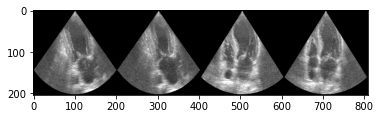

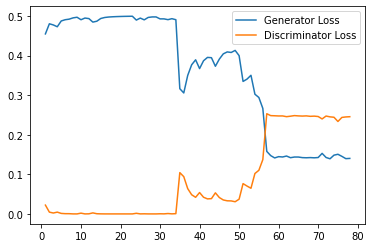


[EPOCH 79/150 | Loss_D: 0.2480 Loss_G: 0.1423


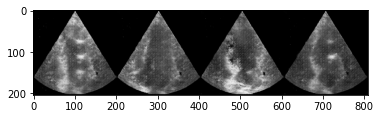

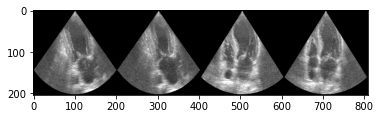

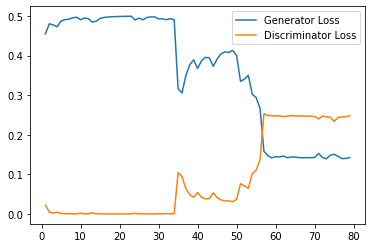


[EPOCH 80/150 | Loss_D: 0.2434 Loss_G: 0.1463


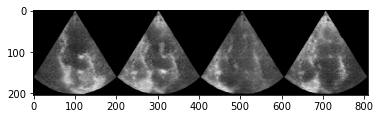

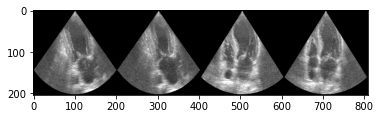

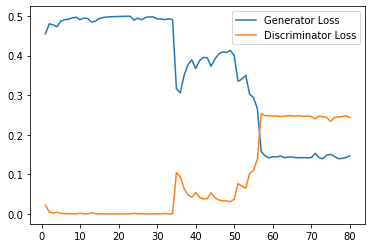


[EPOCH 81/150 | Loss_D: 0.2441 Loss_G: 0.1415


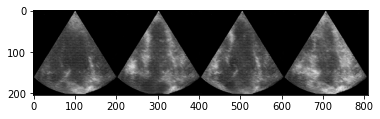

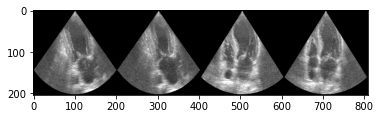

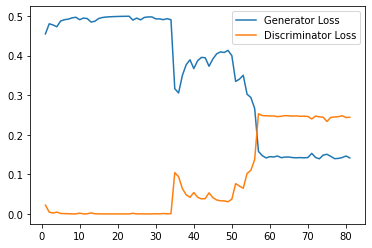


[EPOCH 82/150 | Loss_D: 0.2457 Loss_G: 0.1411


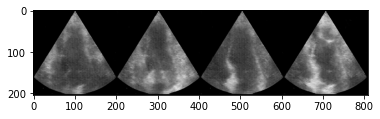

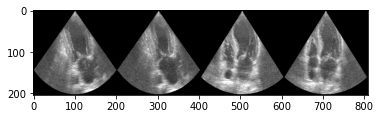

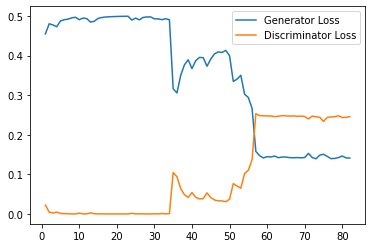


[EPOCH 83/150 | Loss_D: 0.2479 Loss_G: 0.1354


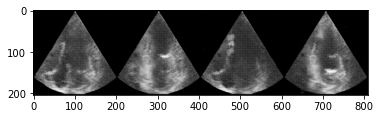

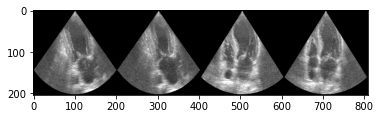

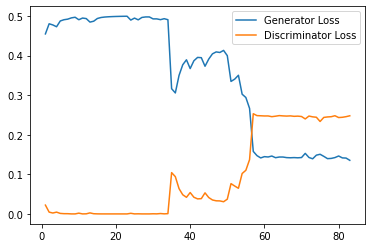


[EPOCH 84/150 | Loss_D: 0.2475 Loss_G: 0.1341


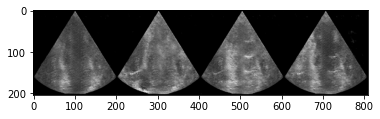

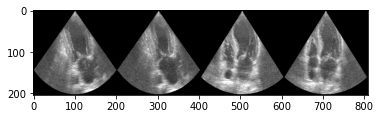

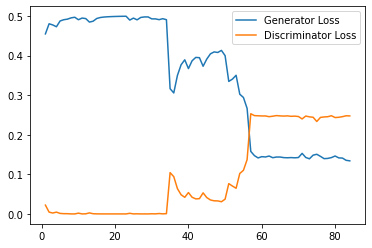


[EPOCH 85/150 | Loss_D: 0.2424 Loss_G: 0.1416


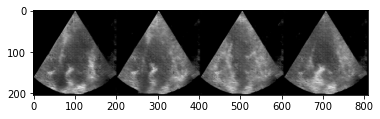

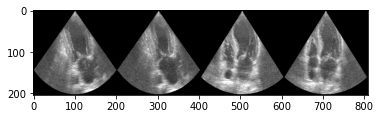

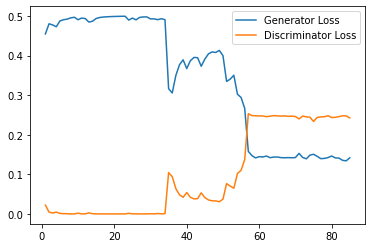


[EPOCH 86/150 | Loss_D: 0.2467 Loss_G: 0.1436


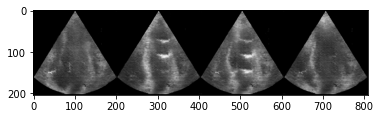

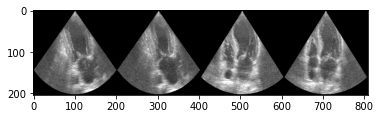

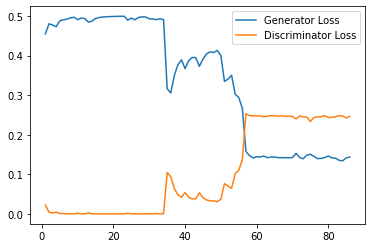


[EPOCH 87/150 | Loss_D: 0.2360 Loss_G: 0.1496


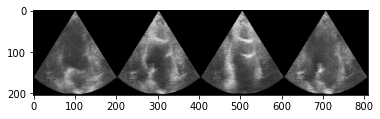

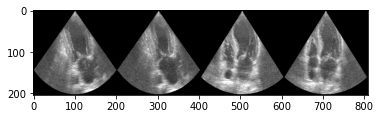

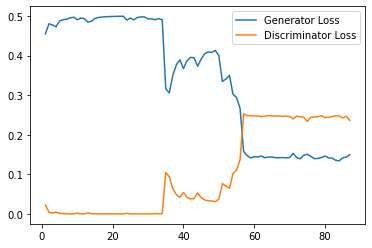


[EPOCH 88/150 | Loss_D: 0.2477 Loss_G: 0.1371


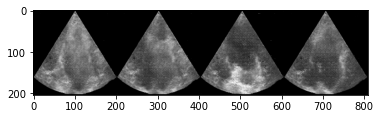

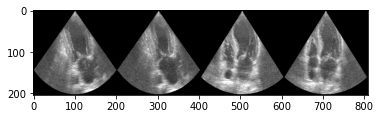

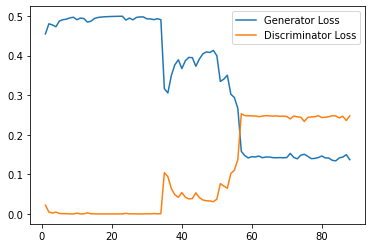


[EPOCH 89/150 | Loss_D: 0.2424 Loss_G: 0.1465


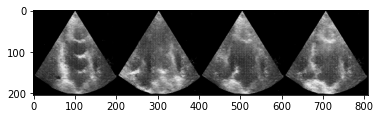

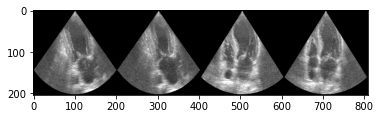

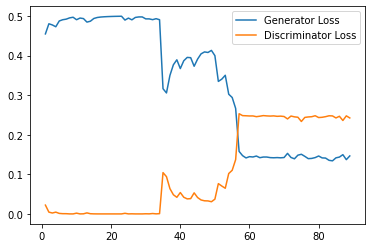


[EPOCH 90/150 | Loss_D: 0.2121 Loss_G: 0.1728


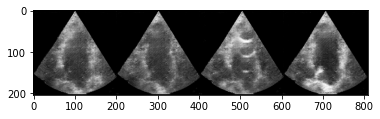

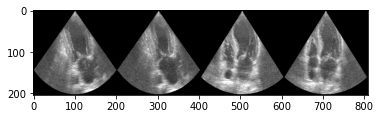

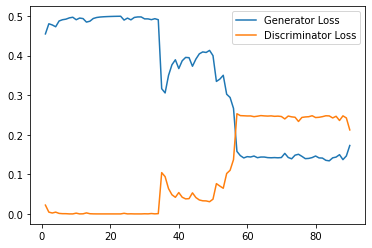


[EPOCH 91/150 | Loss_D: 0.2369 Loss_G: 0.1541


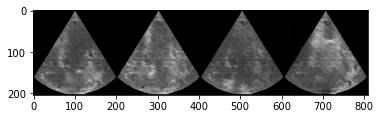

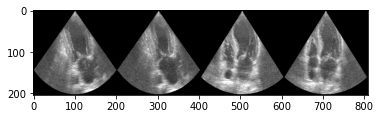

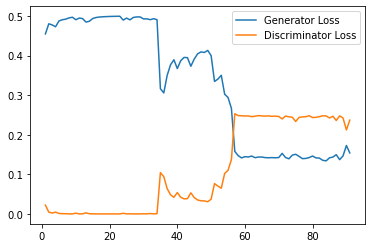


[EPOCH 92/150 | Loss_D: 0.2486 Loss_G: 0.1343


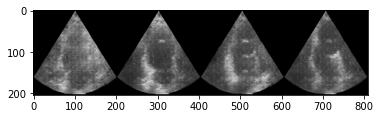

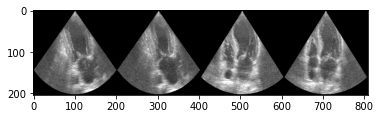

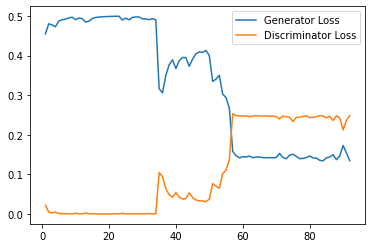


[EPOCH 93/150 | Loss_D: 0.2191 Loss_G: 0.1661


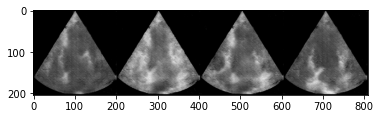

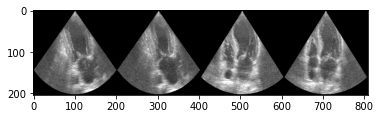

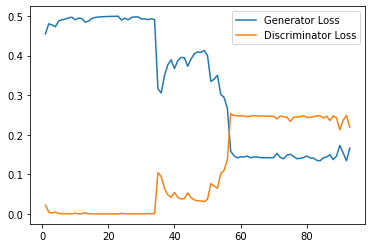


[EPOCH 94/150 | Loss_D: 0.1662 Loss_G: 0.2224


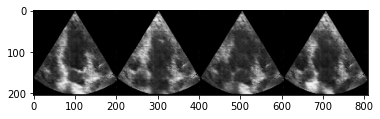

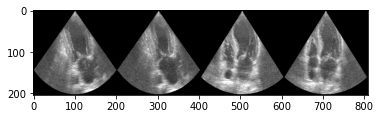

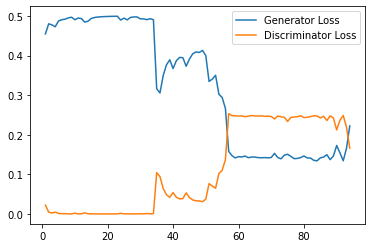


[EPOCH 95/150 | Loss_D: 0.1401 Loss_G: 0.2484


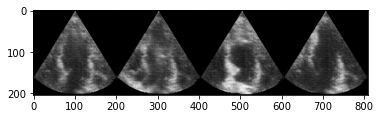

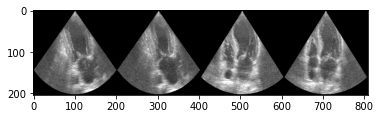

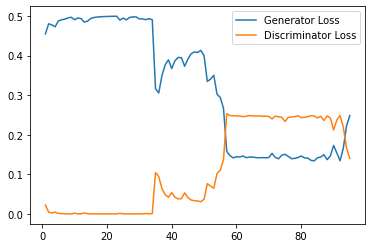


[EPOCH 96/150 | Loss_D: 0.2311 Loss_G: 0.1681


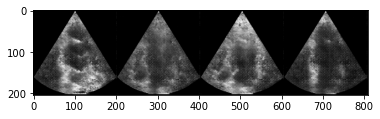

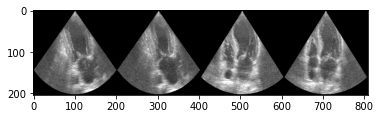

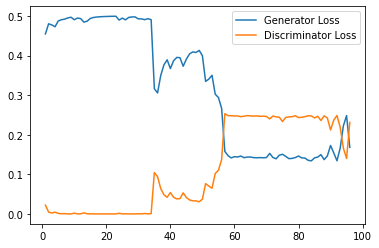


[EPOCH 97/150 | Loss_D: 0.2453 Loss_G: 0.1382


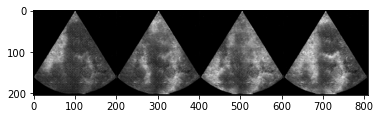

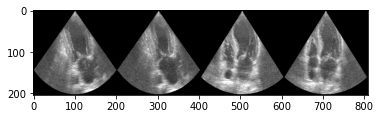

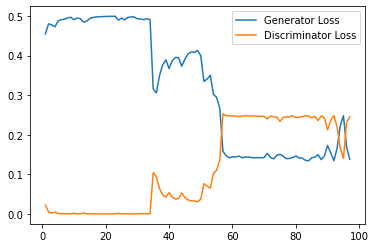


[EPOCH 98/150 | Loss_D: 0.2449 Loss_G: 0.1423


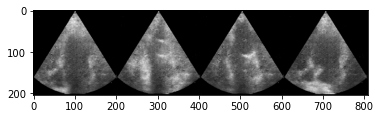

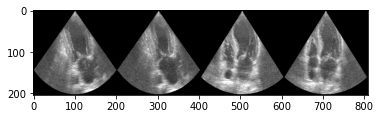

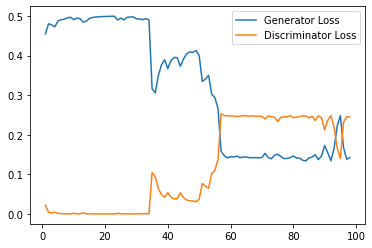


[EPOCH 99/150 | Loss_D: 0.2430 Loss_G: 0.1440


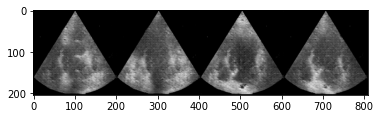

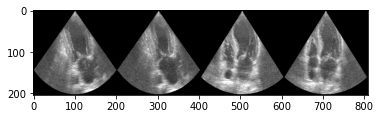

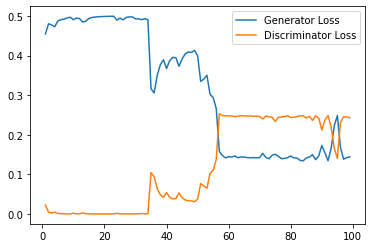


[EPOCH 100/150 | Loss_D: 0.2384 Loss_G: 0.1515


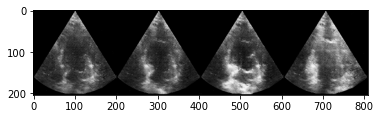

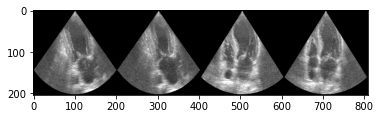

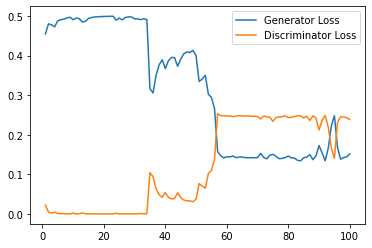


[EPOCH 101/150 | Loss_D: 0.2292 Loss_G: 0.1626


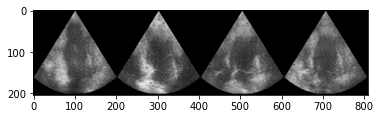

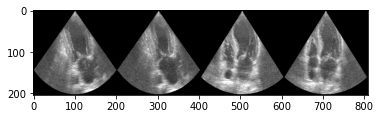

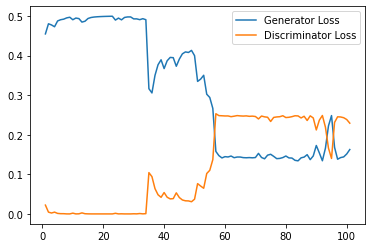


[EPOCH 102/150 | Loss_D: 0.1729 Loss_G: 0.2082


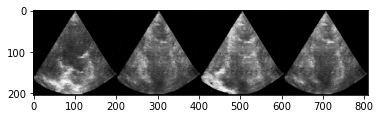

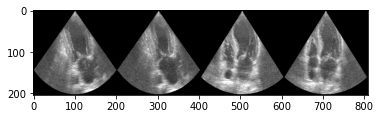

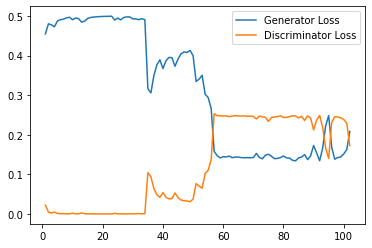


[EPOCH 103/150 | Loss_D: 0.1289 Loss_G: 0.2548


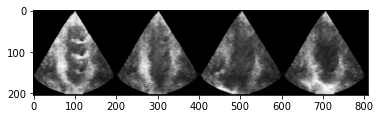

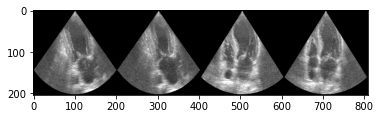

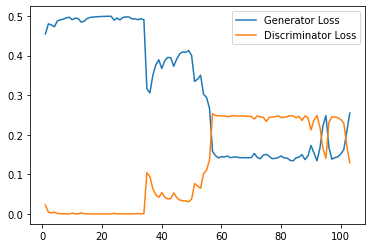


[EPOCH 104/150 | Loss_D: 0.0925 Loss_G: 0.2918


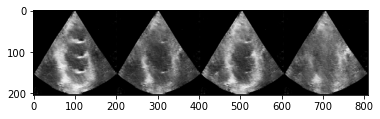

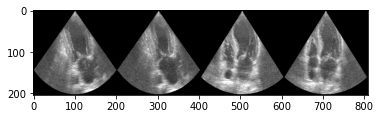

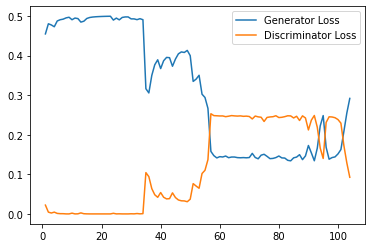


[EPOCH 105/150 | Loss_D: 0.0745 Loss_G: 0.3192


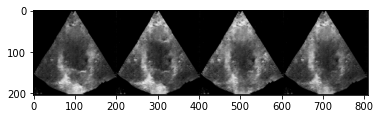

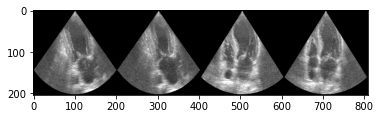

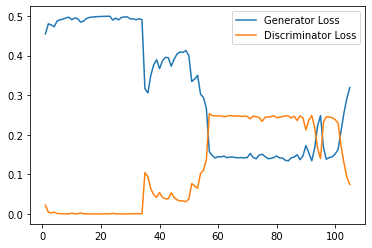


[EPOCH 106/150 | Loss_D: 0.0247 Loss_G: 0.3844


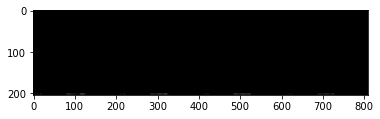

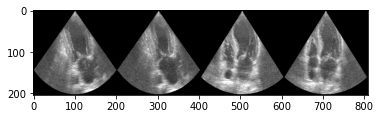

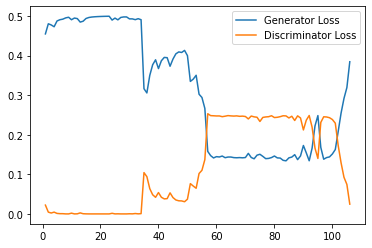


[EPOCH 107/150 | Loss_D: 0.0019 Loss_G: 0.4615


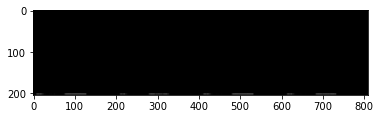

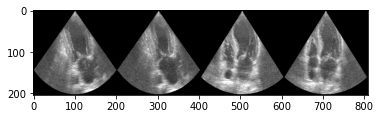

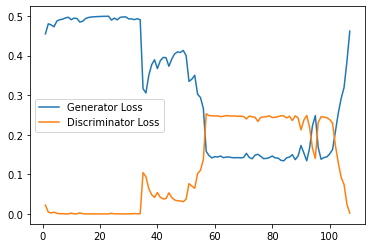


[EPOCH 108/150 | Loss_D: 0.0011 Loss_G: 0.4824


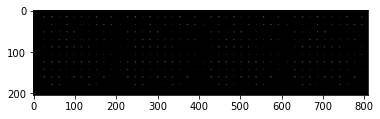

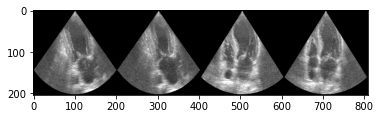

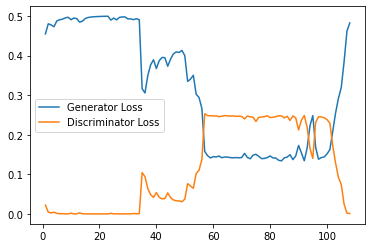


[EPOCH 109/150 | Loss_D: 0.0009 Loss_G: 0.4838


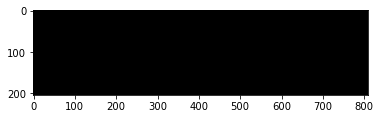

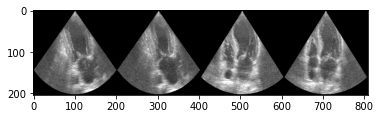

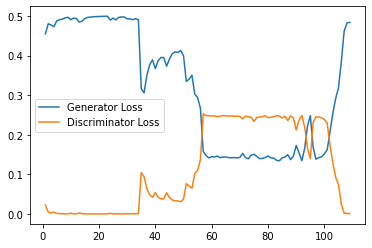


[EPOCH 110/150 | Loss_D: 0.0007 Loss_G: 0.4875


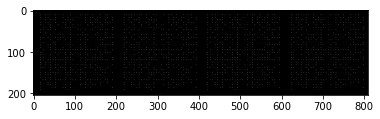

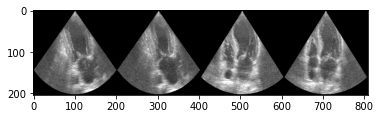

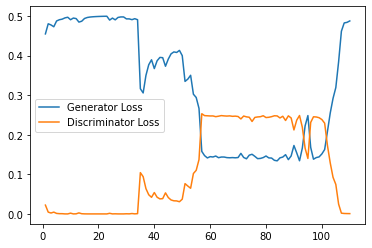


[EPOCH 111/150 | Loss_D: 0.0014 Loss_G: 0.4908


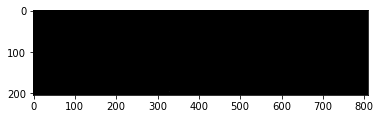

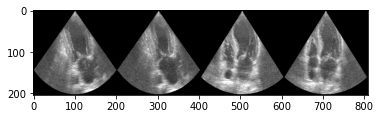

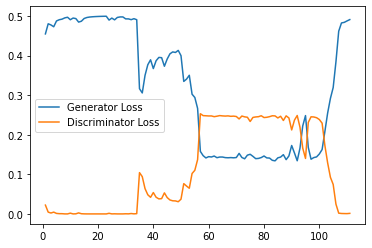


[EPOCH 112/150 | Loss_D: 0.0008 Loss_G: 0.4865


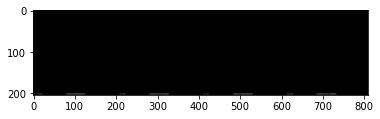

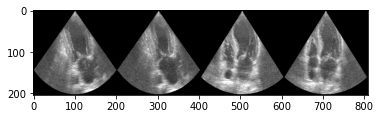

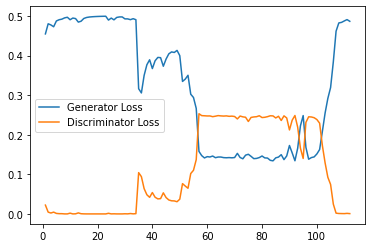


[EPOCH 113/150 | Loss_D: 0.0004 Loss_G: 0.4912


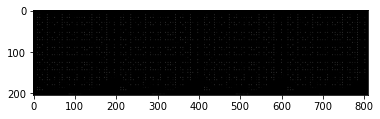

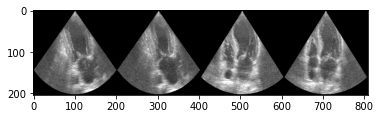

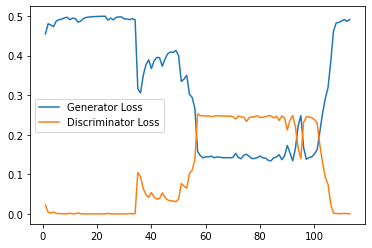


[EPOCH 114/150 | Loss_D: 0.0008 Loss_G: 0.4913


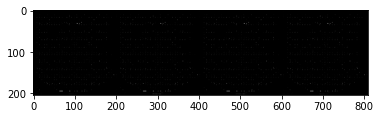

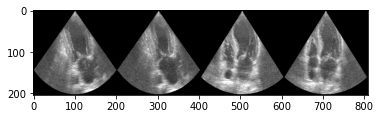

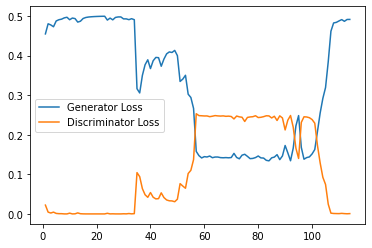


[EPOCH 115/150 | Loss_D: 0.0980 Loss_G: 0.3370


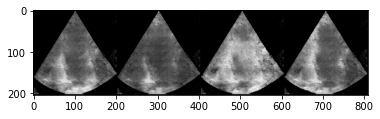

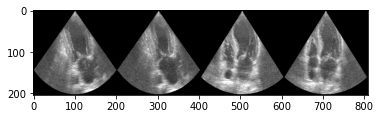

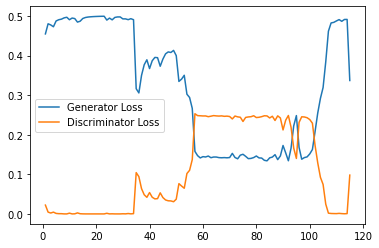


[EPOCH 116/150 | Loss_D: 0.0832 Loss_G: 0.3098


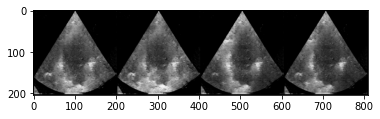

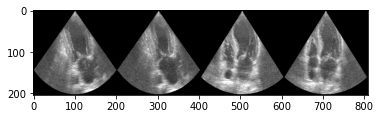

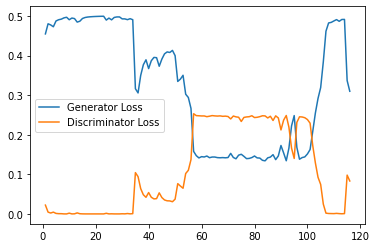


[EPOCH 117/150 | Loss_D: 0.0718 Loss_G: 0.3379


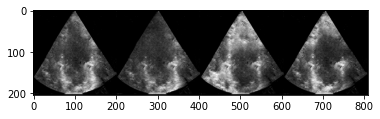

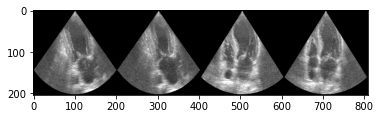

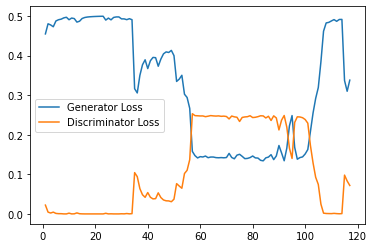


[EPOCH 118/150 | Loss_D: 0.0623 Loss_G: 0.3439


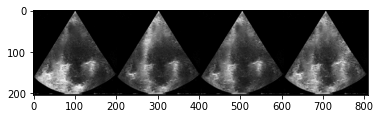

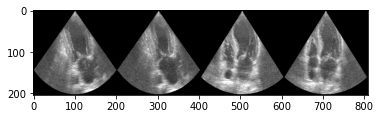

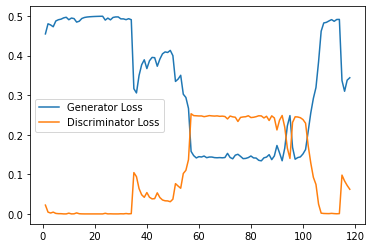


[EPOCH 119/150 | Loss_D: 0.0584 Loss_G: 0.3597


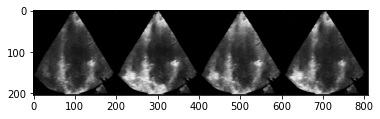

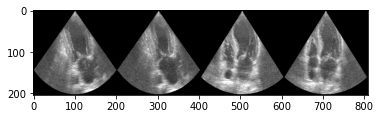

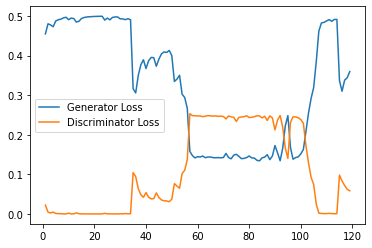


[EPOCH 120/150 | Loss_D: 0.0514 Loss_G: 0.3659


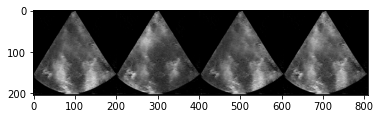

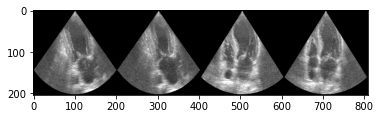

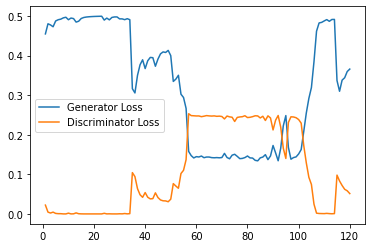


[EPOCH 121/150 | Loss_D: 0.0593 Loss_G: 0.3507


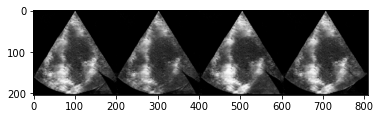

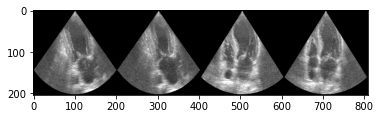

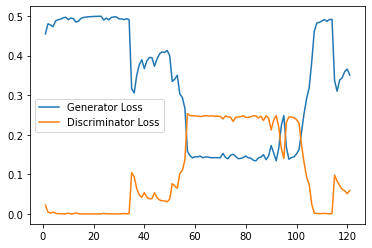


[EPOCH 122/150 | Loss_D: 0.0778 Loss_G: 0.3266


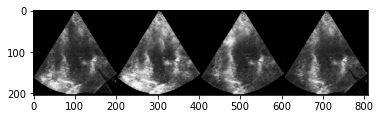

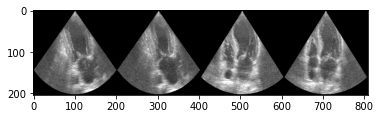

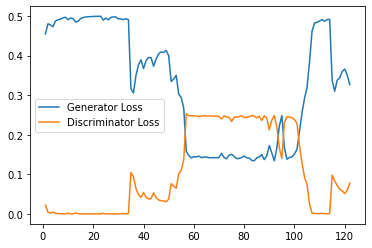


[EPOCH 123/150 | Loss_D: 0.0664 Loss_G: 0.3402


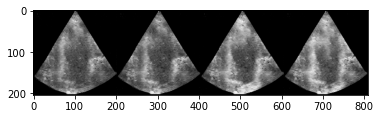

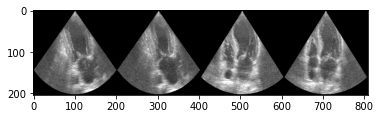

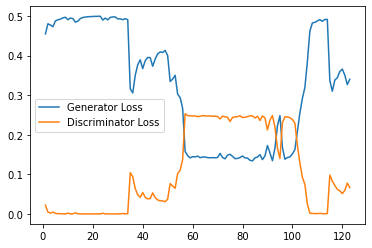


[EPOCH 124/150 | Loss_D: 0.0520 Loss_G: 0.3570


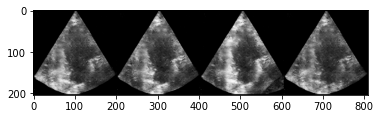

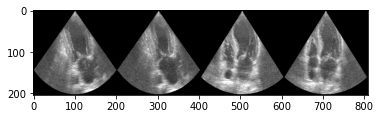

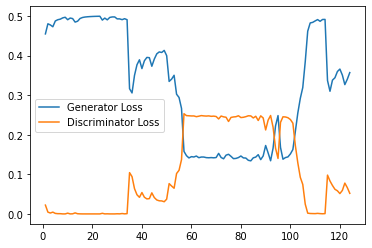


[EPOCH 125/150 | Loss_D: 0.0557 Loss_G: 0.3618


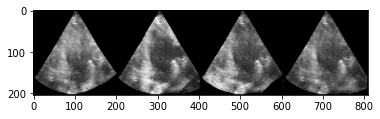

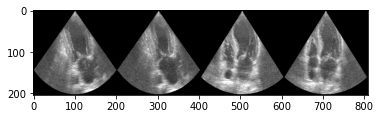

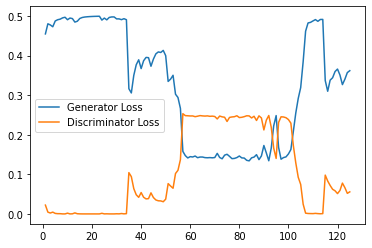


[EPOCH 126/150 | Loss_D: 0.0625 Loss_G: 0.3612


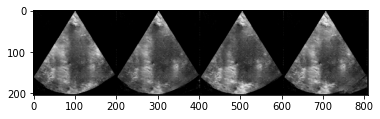

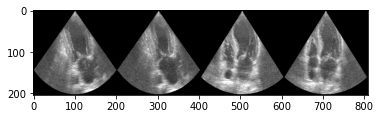

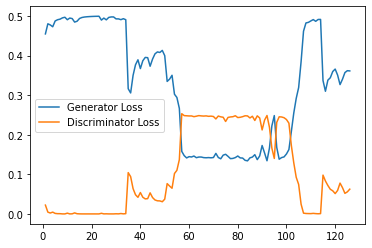


[EPOCH 127/150 | Loss_D: 0.0561 Loss_G: 0.3628


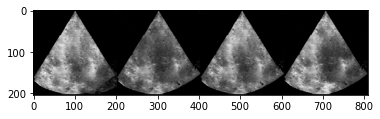

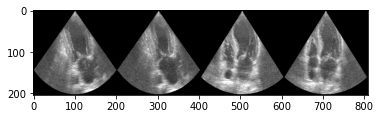

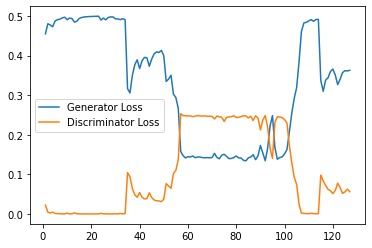


[EPOCH 128/150 | Loss_D: 0.0433 Loss_G: 0.3830


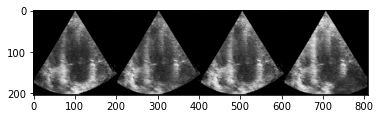

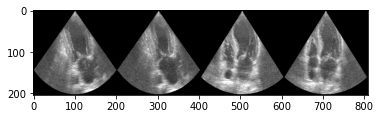

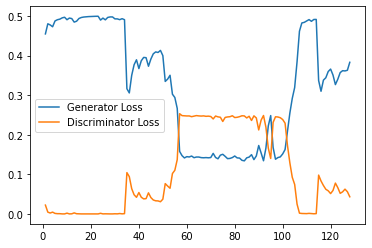


[EPOCH 129/150 | Loss_D: 0.0392 Loss_G: 0.3879


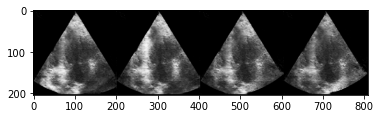

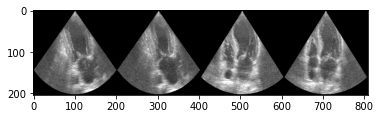

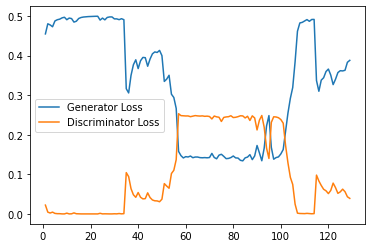


[EPOCH 130/150 | Loss_D: 0.0405 Loss_G: 0.3889


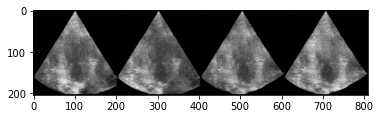

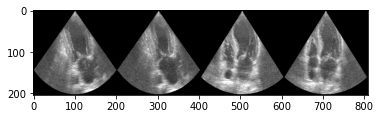

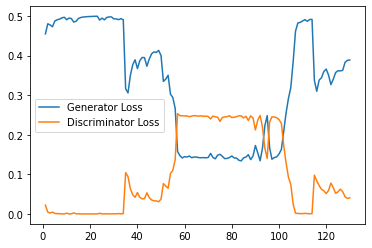


[EPOCH 131/150 | Loss_D: 0.0560 Loss_G: 0.3707


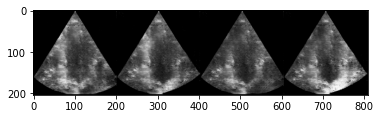

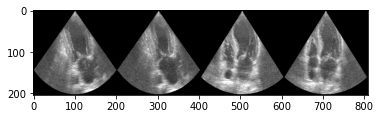

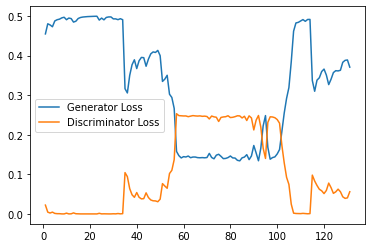


[EPOCH 132/150 | Loss_D: 0.0478 Loss_G: 0.3859


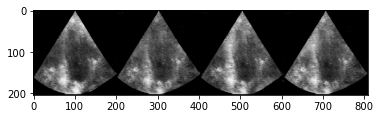

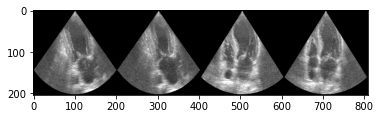

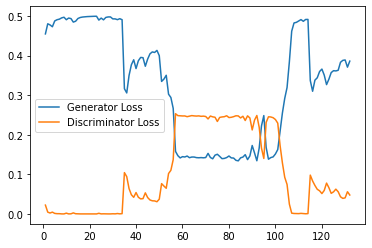


[EPOCH 133/150 | Loss_D: 0.0473 Loss_G: 0.3822


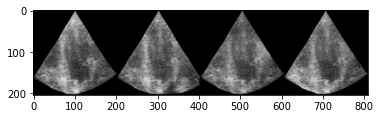

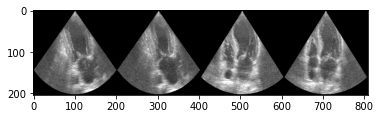

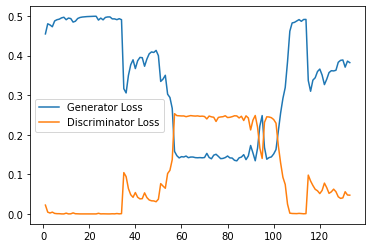


[EPOCH 134/150 | Loss_D: 0.0429 Loss_G: 0.3927


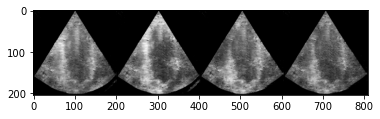

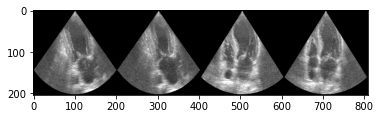

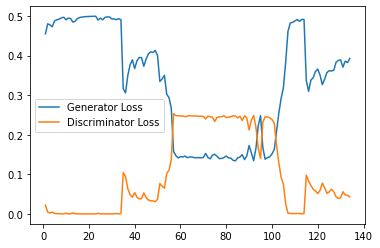


[EPOCH 135/150 | Loss_D: 0.0432 Loss_G: 0.4028


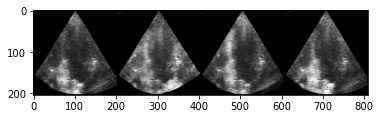

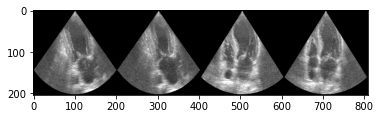

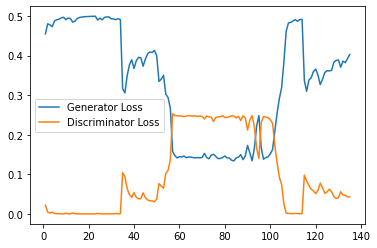


[EPOCH 136/150 | Loss_D: 0.0435 Loss_G: 0.3938


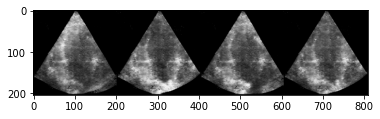

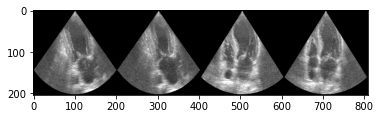

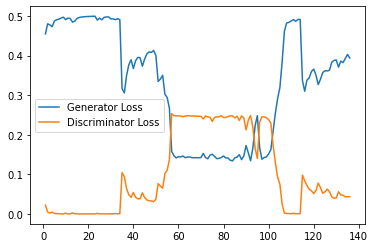


[EPOCH 137/150 | Loss_D: 0.0370 Loss_G: 0.4029


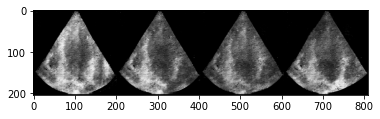

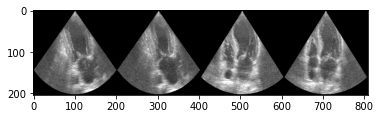

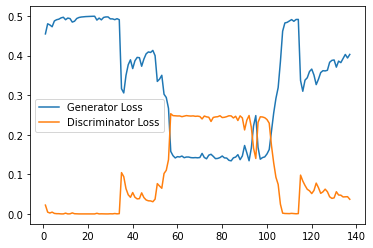


[EPOCH 138/150 | Loss_D: 0.0356 Loss_G: 0.4063


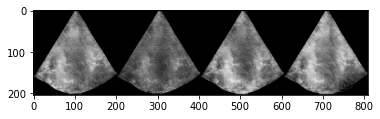

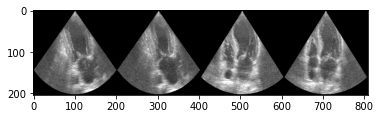

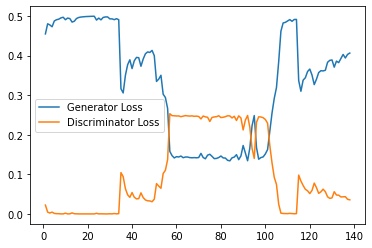


[EPOCH 139/150 | Loss_D: 0.0305 Loss_G: 0.4158


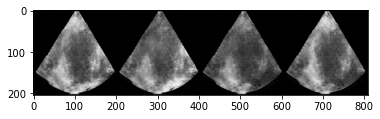

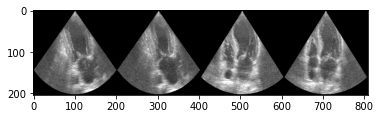

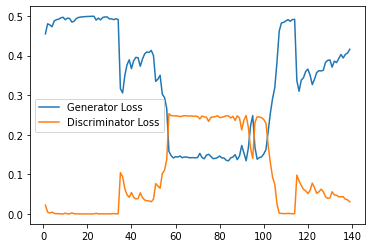


[EPOCH 140/150 | Loss_D: 0.0279 Loss_G: 0.4219


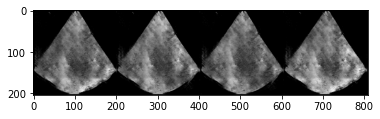

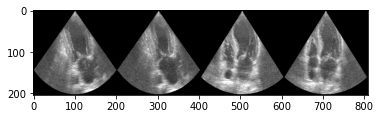

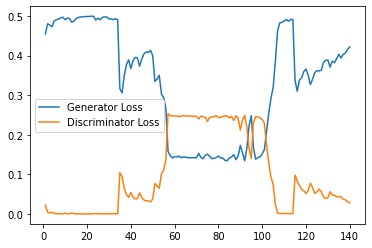


[EPOCH 141/150 | Loss_D: 0.0229 Loss_G: 0.4293


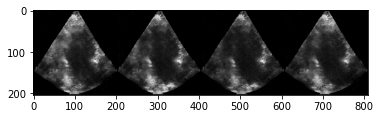

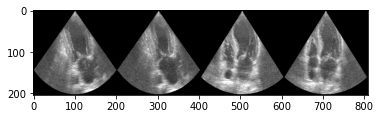

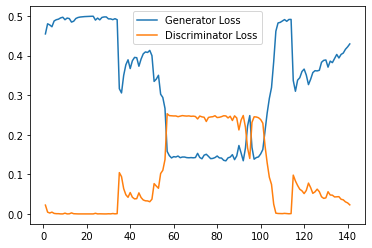


[EPOCH 142/150 | Loss_D: 0.0159 Loss_G: 0.4361


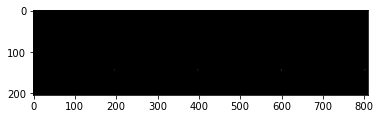

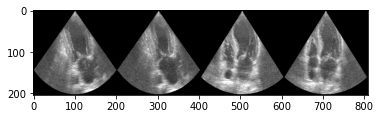

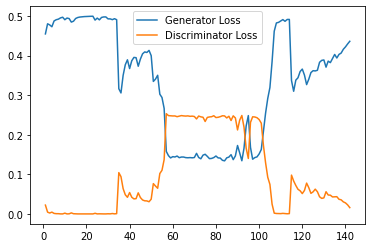


[EPOCH 143/150 | Loss_D: 0.0019 Loss_G: 0.4715


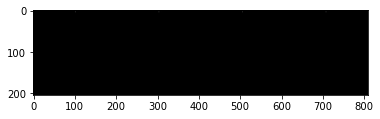

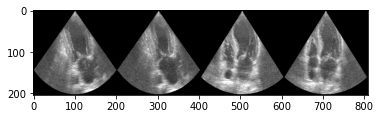

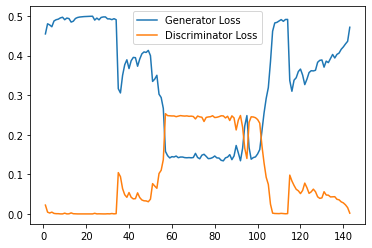

KeyboardInterrupt: 

In [8]:
gen = Generator(z_dim=config["z_dim"]).to(config["device"])
weights_init(gen)
gen_opt = torch.optim.Adam(gen.parameters(), lr=config["gen_lr"], betas=(config["beta_1"], config["beta_2"]))

disc = Discriminator(spectral_norm=config["spectral_norm"]).to(config["device"])
weights_init(disc)
disc_opt = torch.optim.Adam(disc.parameters(), lr=config["disc_lr"], betas=(config["beta_1"], config["beta_2"]))

gen_losses = []
disc_losses = []
for epoch in range(1, config["n_epochs"] + 1):
    epoch_gen_loss = 0
    epoch_disc_loss = 0

    for real in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(config["device"])

        ## Update discriminator ###
        running_disc_loss = 0
        for _ in range(config["disc_repeats"]):
            disc_opt.zero_grad()
            
            fake = gen(get_noise(cur_batch_size, config["z_dim"], device=config["device"]))
            disc_fake_pred, _ = disc(fake.detach())

            disc_real_pred, disc_real_feat = disc(real)
            disc_loss = get_disc_loss(disc_fake_pred, disc_real_pred)
            disc_loss.backward()
            
            disc_opt.step()
            
            running_disc_loss += disc_loss.item() / config["disc_repeats"]      

        epoch_disc_loss += running_disc_loss / len(dataloader)

        ### Update generator ###
        running_gen_loss = 0
        for _ in range(config["gen_repeats"]):
            gen_opt.zero_grad()

            fake_2 = gen(get_noise(cur_batch_size, config["z_dim"], device=config["device"]))
            
            _, disc_real_feat = disc(real)
            disc_fake_pred, disc_fake_feat = disc(fake_2)
        
            gen_loss = get_gen_loss(disc_fake_pred)# + config["f_lambda"] * criterion(disc_fake_feat, disc_real_feat)
#             gen_loss += config["f_lambda"] * criterion(disc_fake_feat, disc_real_feat)

            gen_loss.backward()
            gen_opt.step()
            
            running_gen_loss += gen_loss.item() / config["gen_repeats"]

        epoch_gen_loss += running_gen_loss / len(dataloader)
    
    disc_losses += [epoch_disc_loss]
    gen_losses += [epoch_gen_loss]
    print(f"[EPOCH {epoch}/{config['n_epochs']} | Loss_D: {epoch_disc_loss:.4f} Loss_G: {epoch_gen_loss:.4f}")
    show_tensor_images((fake_2 + 1) / 2)
    show_tensor_images((real + 1) / 2)
    plt.plot(range(1, len(gen_losses) + 1), gen_losses, label="Generator Loss")
    plt.plot(range(1, len(disc_losses) + 1), disc_losses, label="Discriminator Loss")
    plt.legend(loc="best")
    plt.show()
    
    if epoch % config["epoch_log_step"] == 0:
        save_model(epoch, gen, disc, gen_opt, disc_opt)
        
save_loss(f"{result_folder}/disc_loss.csv", disc_losses)
save_loss(f"{result_folder}/gen_loss.csv", gen_losses)

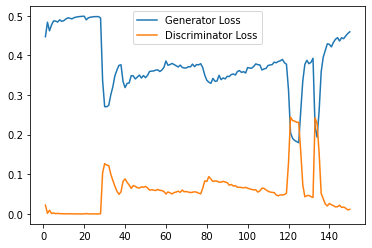

In [10]:
plt.plot(range(1, len(gen_losses) + 1), gen_losses, label="Generator Loss")
plt.plot(range(1, len(disc_losses) + 1), disc_losses, label="Discriminator Loss")
plt.legend(loc="best")
plt.savefig(f"lsloss_loss.pdf", bbox_inches='tight')
plt.show()



In [3]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5), (0.5)),
    transforms.Resize((200, 200))
    
])
val_dataset = USImagesDataset("camus-images/image", image_transform=transform)
val_dataloader = DataLoader(val_dataset, batch_size=10, num_workers=0)

In [12]:
device = "cuda"
test_gen = Generator(z_dim=config["z_dim"]).to(config["device"]).to(device)
test_gen.load_state_dict(torch.load("./gan-lsloss-02-12-2021-12:39/130.pth")["gan"])
test_gen.eval()

unet_model = UNet(hidden_channels=16).to(config["device"])
unet_model.load_state_dict(torch.load("./unet-results/u-net_79.pth")["unet"])
unet_model.eval()

fake_features_list = []
real_features_list = []
with torch.no_grad():
    for real_example in tqdm(val_dataloader):
        real_samples = real_example.to(device)
        pred, real_features = unet_model(real_samples)
        
        real_features = torch.flatten(real_features.detach().to('cpu'), start_dim=1)
        real_features_list.append(real_features)

        fake_samples = get_noise(len(real_example), config["z_dim"]).to(config["device"])
        fake_samples = test_gen(fake_samples)
        _, fake_features = unet_model(fake_samples.to(config["device"]))
        fake_features = torch.flatten(fake_features.detach().to('cpu'), start_dim=1)
        fake_features_list.append(fake_features)
    
fake_features_all = torch.cat(fake_features_list)
real_features_all = torch.cat(real_features_list)
fid = get_FID(fake_features_all, real_features_all)

In [13]:
fid.item()

218.30047607421875